# PRNN Assignment 1 Group 12

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.lines as mlines

## Q1

### Preprocessing

In [2]:
# Load the dataset
data_path = './datasets/regression_data_multilinear_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)  # Randomly shuffle the data

# Separate features and targets again
X = data[:, :10]  # Features (sensor readings)
y = data[:, 10:]  # Targets (y1, y2, y3 positions)

split_idx1 = int(X.shape[0] * 0.6)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1]
X_val = X[split_idx1:split_idx2]
X_test = X[split_idx2:]
y_train = y[:split_idx1]
y_val = y[split_idx1:split_idx2]
y_test = y[split_idx2:]

mean_X = np.mean(X_train, axis=0)
std_dev_X = np.std(X_train, axis=0)
norm2_X = np.linalg.norm(X_train, axis=0)

mean_y = np.mean(y_train, axis=0)
std_dev_y = np.std(y_train, axis=0)
norm2_y = np.linalg.norm(y_train, axis=0)

X_train_norm_2 = X_train / norm2_X
y_train_norm_2 = y_train / norm2_y

X_val_norm_2 = X_val / norm2_X
y_val_norm_2 = y_val / norm2_y

X_test_norm_2 = X_test / norm2_X
y_test_norm_2 = y_test / norm2_y

X_train_norm_zs = (X_train - mean_X) / std_dev_X
y_train_norm_zs = (y_train - mean_y) / std_dev_y

X_val_norm_zs = (X_val - mean_X) / std_dev_X
y_val_norm_zs = (y_val - mean_y) / std_dev_y

X_test_norm_zs = (X_test - mean_X) / std_dev_X
y_test_norm_zs = (y_test - mean_y) / std_dev_y

### $X$  -> $[X:1]$

In [3]:
def phi_x(X):
    return np.c_[X, np.ones((X.shape[0], 1))]

### Weights and biases using closed form eq of ERM

In [4]:
def get_theta(X, y):
    # Add a bias term (column of ones) to X for the intercept
    X_b = phi_x(X)

    # Solve the normal equation again: theta = (X_b.T * X_b)^(-1) * X_b.T * y
    theta = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

    return theta

### Print the linear relation b/w each $y$ and and the features($X1$ - $X10$)

In [5]:
def print_poly(theta, norm=""):
    m, n = theta.shape
    norm = "_"+norm if norm != "" else ""
    for i in range(n):
        poly = ""

        for j in range(m):

            poly += f"{theta[j][i]:.4f}*X{j+1}{norm} + "

        print(poly + f"{theta[j][i]:.4f} = y{i+1}{norm}'")

### Calculate metrics (Pearson Correlation Coefficient, Root mean squared error, Mean absolute error)

In [6]:
# Recalculating the Pearson Correlation, MSE, and MAE using only numpy

# Function to calculate Pearson Correlation Coefficient
def pearson_correlation(actual, predicted):
    numerator = np.sum((actual - np.mean(actual)) *
                       (predicted - np.mean(predicted)))
    denominator = np.sqrt(np.sum((actual - np.mean(actual))**2)
                          * np.sum((predicted - np.mean(predicted))**2))
    return numerator / denominator

# Function to calculate Mean Squared Error


def root_mean_squared_error(actual, predicted):
    return np.sqrt(np.mean((actual - predicted) ** 2))

# Function to calculate Mean Absolute Error


def mean_absolute_error(actual, predicted):
    return np.mean(np.abs(actual - predicted))


def get_metrics(y, y_pred):

    # Calculating Pearson Correlation for each target
    pearson_corr = np.array([pearson_correlation(
        y[:, i], y_pred[:, i]) for i in range(y.shape[1])])

    # Calculating MSE and MAE for each target
    rmse = np.array([root_mean_squared_error(y[:, i], y_pred[:, i])
                    for i in range(y.shape[1])])
    mae = np.array([mean_absolute_error(y[:, i], y_pred[:, i])
                    for i in range(y.shape[1])])

    return pearson_corr, rmse, mae

### Look-up table for p-values

In [7]:
lookup_table_refined = {
    0.05: 1.960,  # Critical value for p = 0.05
    0.01: 2.576,  # Critical value for p = 0.01
    0.001: 3.291  # Critical value for p = 0.001
}

### Plot $y$ & $y_{pred}$ with metrics

In [8]:
def plot_y(X, y, theta, norm=""):
   # Adjusting the correlation plots to include the best fit line and y=x line
    X_b = phi_x(X)
    y_pred = np.matmul(X_b, theta)

    pc, rmse, mae = get_metrics(y, y_pred)

    plt.figure(figsize=(10, 15))

    for i in range(y.shape[1]):
        # Scatter plot for actual vs predicted
        plt.subplot(3, 1, i+1)
        plt.scatter(y[:, i], y_pred[:, i], alpha=0.5,
                    color='green', marker='x')

        # Best fit line (red line)
        m, b = np.polyfit(y[:, i], y_pred[:, i], 1)  # m = slope, b = intercept
        plt.plot(y[:, i], m * y[:, i] + b, 'r--', label='Best Fit Line')

        # y=x line (black dotted line)
        plt.plot(y[:, i], y[:, i], 'k--', label='y=x Line')

        # Calculate Standard Error
        errors = y[:, i] - y_pred[:, i]
        s_sq = errors.T @ errors / (X.shape[0] - len(theta) - 1)
        SE_Theta = np.sqrt(np.diag(np.linalg.inv(X.T @ X) * s_sq))

        # Step 3: Calculate t-Statistic for each coefficient
        t_stats = theta[:, i].flatten()[:-1] / SE_Theta

        # Determine the p-value approximation based on the refined critical values
        # Default if t-statistic is below the lowest threshold
        p_value = ["p>0.05"]*len(t_stats)
        for j, t in enumerate(t_stats):
            for p, t_crit in lookup_table_refined.items():
                if abs(t) > t_crit:
                    p_value[j] = f"p<{p}"

        print(p_value)

        # Creating custom legend handles
        pc_handle = mlines.Line2D([], [], color='none', marker='None',
                                  label=f'r={pc[i]:.4f}')
        rmse_handle = mlines.Line2D([], [], color='none', marker='None',
                                    label=f'rmse={rmse[i]:.4f}')
        mae_handle = mlines.Line2D([], [], color='none', marker='None',
                                   label=f'mae={mae[i]:.4f}')

        # Adding custom legend handles to the existing legend handles
        handles, labels = plt.gca().get_legend_handles_labels()
        handles.extend([pc_handle, rmse_handle, mae_handle])

        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title(f'Correlation Plot for y{i+1} {norm}')

        # Creating the legend with the custom handles
        plt.legend(handles=handles)

    plt.tight_layout()
    plt.show()

### Gradient Descent

In [9]:
def h(X):
    return phi_x(X)


def L(a, b):
    return np.square(np.linalg.norm(a - b))


def R(X, y, theta):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y))


def dR_dtheta(X, y, theta):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y)


def grad_desc_sq_err(X, y, X_, y_, lr=0.1, epochs=10000, eps=0.05):
    train_losses = []
    val_losses = []
    h_X = h(X)
    h_X_ = h(X_)
    theta = np.random.rand(h_X.shape[1], y.shape[1])
    for i in range(epochs):
        train_losses.append(R(h_X, y, theta))
        grad_theta = dR_dtheta(h_X, y, theta)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta

        val_losses.append(R(h_X_, y_, theta))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)




### GD with *L2*-reg

In [10]:
def R_reg(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y)) + 0.5 * lambd * np.sum(np.square(theta_no_bias))


def dR_dtheta_reg(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y) + lambd * np.sum(theta_no_bias)


def grad_desc_sq_err_reg(X, y, X_, y_, lr=0.1, epochs=10000, eps=0.05):
    train_losses = []
    val_losses = []
    h_X = h(X)
    h_X_ = h(X_)
    theta_no_bias = theta = np.random.rand(h_X.shape[1], y.shape[1])
    theta_no_bias[:, -1] = 0
    for i in range(epochs):
        train_losses.append(R_reg(h_X, y, theta, theta_no_bias))
        grad_theta = dR_dtheta_reg(h_X, y, theta, theta_no_bias)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta
        val_losses.append(R_reg(h_X_, y_, theta, theta_no_bias))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} |  Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)

### Plot train-val Risks

In [11]:
def plot_train_loss(tl, vl):
    # Plotting the Risk history to see the convergence
    plt.plot(tl, label='Emprical Risk(Training)')
    plt.plot(vl, label='Emprical Risk(Validation)')
    plt.xlabel('Iteration')
    plt.ylabel('Risk')
    plt.title('Risk Function History')
    plt.legend()
    plt.show()

### Testing Closed form eq. performance

2.3124*X1 + -2.3773*X2 + 0.4016*X3 + -4.9969*X4 + 4.3006*X5 + 4.0583*X6 + -4.7034*X7 + 4.6880*X8 + -3.6735*X9 + -2.1905*X10 + -3.4816*X11 + -3.4816 = y1'
4.5091*X1 + 3.5247*X2 + -5.0123*X3 + 0.2000*X4 + 0.4662*X5 + -0.1165*X6 + 2.7025*X7 + -3.4126*X8 + 2.6512*X9 + -4.7221*X10 + 1.0703*X11 + 1.0703 = y2'
-3.8342*X1 + -1.8729*X2 + 1.6729*X3 + -0.3207*X4 + 3.1367*X5 + -2.0342*X6 + 2.3644*X7 + 1.9776*X8 + -1.6662*X9 + -1.6279*X10 + -3.6599*X11 + -3.6599 = y3'
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


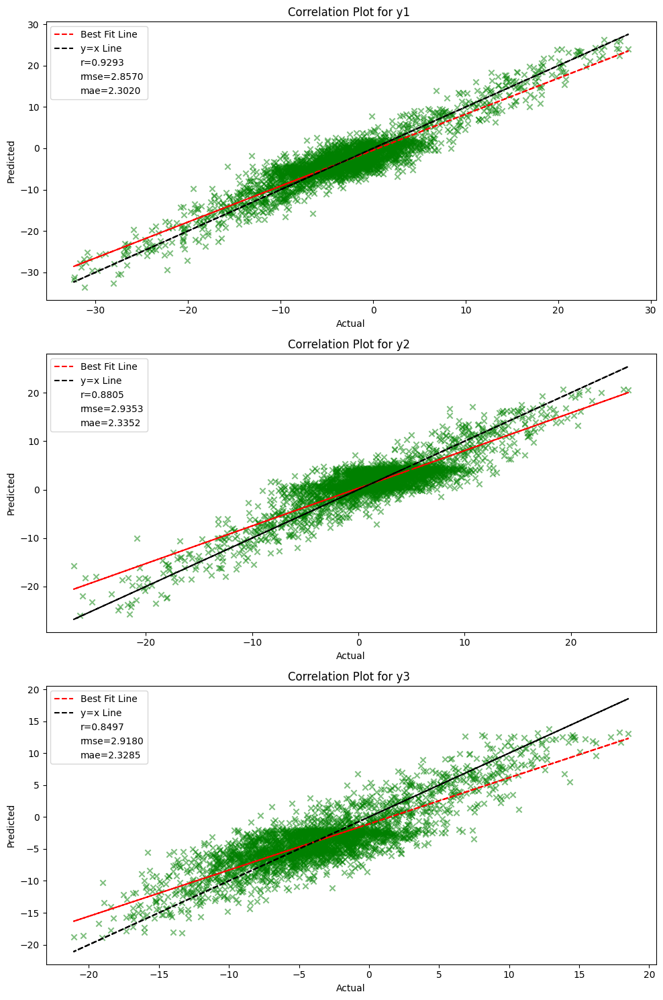

In [12]:
# Display the calculated coefficients
theta = get_theta(X_train, y_train)
print_poly(theta)
plot_y(X_test, y_test, theta)

# theta_norm2 = get_theta(X_train_norm_2, y_train_norm_2)
# print_poly(theta_norm2, "norm_2")
# plot_y(X_test_norm_2, y_test_norm_2, theta_norm2, "norm_2")

# theta_norm_zs = get_theta(X_train_norm_zs, y_train_norm_zs)
# print_poly(theta_norm_zs, "norm_zs")
# plot_y(X_test_norm_zs, y_test_norm_zs, theta_norm_zs, "norm_zs")

- ***OBSERVATIONS***
    - From p-values it is clear that 
        - **$y1$** varies significantly with all **$X1$-$X10$**
        - **$y2$** *does not* depend significantly on **$X4$** and **$X6$**
        - **$y3$** *does not* depend significantly on **$X6$**

### Testing GD performance

Emprical Risk(Training) at epoch 1: 106.1780230101188 | Emprical Risk(Validation) at epoch 1: 77.08869673174803
Emprical Risk(Training) at epoch 51: 15.622486636323943 | Emprical Risk(Validation) at epoch 51: 15.695246423642025
Emprical Risk(Training) at epoch 101: 13.79802110960436 | Emprical Risk(Validation) at epoch 101: 13.94397240228505
Emprical Risk(Training) at epoch 151: 13.156561334485247 | Emprical Risk(Validation) at epoch 151: 13.31521868371553
Emprical Risk(Training) at epoch 201: 12.856634476834115 | Emprical Risk(Validation) at epoch 201: 13.016701203416243
Emprical Risk(Training) at epoch 251: 12.713234996703779 | Emprical Risk(Validation) at epoch 251: 12.872079027591406
Emprical Risk(Training) at epoch 301: 12.644462985917176 | Emprical Risk(Validation) at epoch 301: 12.801629437091869
Emprical Risk(Training) at epoch 351: 12.61142621071786 | Emprical Risk(Validation) at epoch 351: 12.767084923043331
Emprical Risk(Training) at epoch 391: 12.597854143057457 | Emprical 

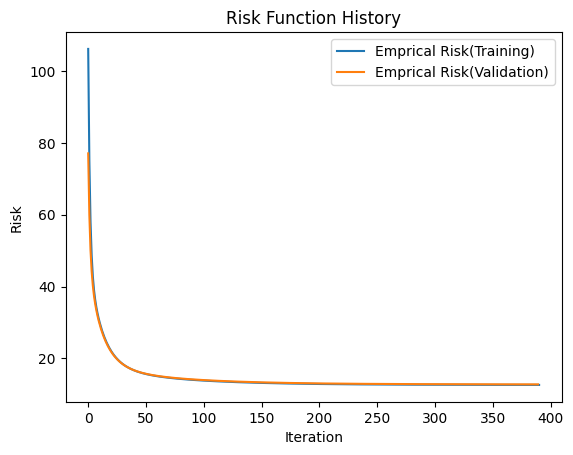

2.1991*X1 + -2.5081*X2 + 0.4658*X3 + -4.6635*X4 + 4.1663*X5 + 3.8747*X6 + -4.7007*X7 + 4.6183*X8 + -3.6527*X9 + -2.0586*X10 + -3.3497*X11 + -3.3497 = y1'
4.2785*X1 + 3.4052*X2 + -4.8853*X3 + 0.1383*X4 + 0.3475*X5 + -0.0853*X6 + 2.7006*X7 + -3.3956*X8 + 2.7003*X9 + -4.6036*X10 + 1.1886*X11 + 1.1886 = y2'
-3.6483*X1 + -1.9940*X2 + 1.5740*X3 + -0.3209*X4 + 3.0169*X5 + -2.0356*X6 + 2.3656*X7 + 1.9783*X8 + -1.7104*X9 + -1.5073*X10 + -3.5381*X11 + -3.5381 = y3'
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


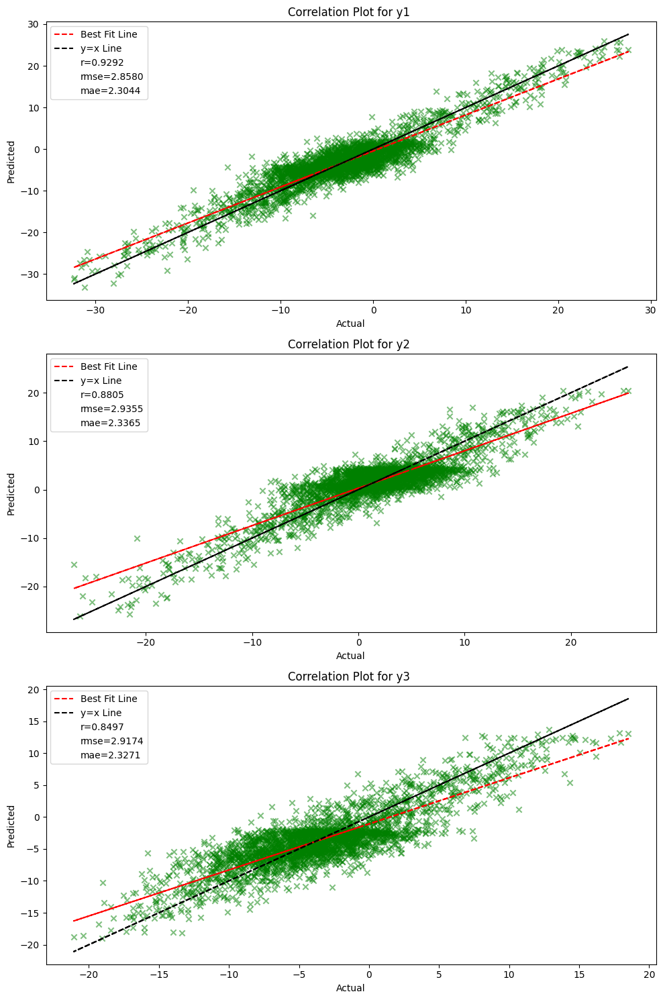

In [13]:
theta_gd, train_losses, val_losses = grad_desc_sq_err(X_train, y_train, X_val, y_val)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd)
plot_y(X_test, y_test, theta_gd)

# theta_gd_norm_2, train_losses, val_losses = grad_desc_sq_err(
#     X_train_norm_2, y_train_norm_2, X_train_norm_2, y_train_norm_2)
# plot_train_loss(train_losses, val_losses)
# print_poly(theta_gd_norm_2, "norm_2")
# plot_y(X_test_norm_2, y_test_norm_2, theta_gd_norm_2, "norm_2")

# theta_gd_norm_zs, train_losses, val_losses = grad_desc_sq_err(
#     X_train_norm_zs, y_train_norm_zs, X_val_norm_zs, y_val_norm_zs)
# plot_train_loss(train_losses, val_losses)
# print_poly(theta_gd_norm_zs, "norm_zs")
# plot_y(X_test_norm_zs, y_test_norm_zs, theta_gd_norm_zs, "norm_zs")

- ***OBSERVATION*** 
    - Similar results as comapred to closed form eq. for all metrics

### Testing *L2* reg GD performance 

Emprical Risk(Training) at epoch 1: 91.21978746105403 | Emprical Risk(Validation) at epoch 1: 65.65053987458427
Emprical Risk(Training) at epoch 51: 24.174534145548176 | Emprical Risk(Validation) at epoch 51: 24.36092846911292
Emprical Risk(Training) at epoch 101: 25.126279659745908 | Emprical Risk(Validation) at epoch 101: 25.34353505024353
Emprical Risk(Training) at epoch 151: 26.00822981325272 | Emprical Risk(Validation) at epoch 151: 26.233489849993344
Emprical Risk(Training) at epoch 201: 26.823903352290557 | Emprical Risk(Validation) at epoch 201: 27.050181204118196
Emprical Risk(Training) at epoch 251: 27.523024553100125 | Emprical Risk(Validation) at epoch 251: 27.747438816189963
Emprical Risk(Training) at epoch 301: 28.077917677913376 | Emprical Risk(Validation) at epoch 301: 28.29975719497869
Emprical Risk(Training) at epoch 351: 28.497227187577153 | Emprical Risk(Validation) at epoch 351: 28.71668749025979
Emprical Risk(Training) at epoch 395: 28.772796542640904 |  Emprical 

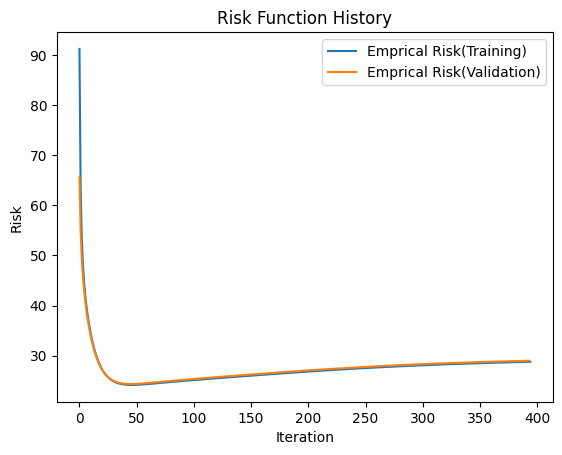

['p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


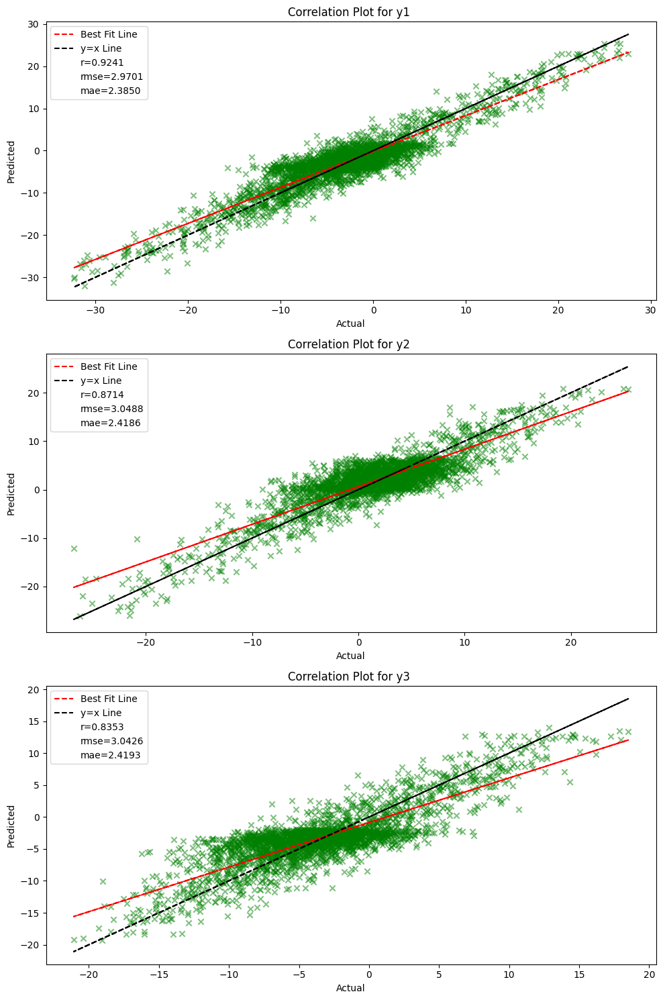

In [14]:
theta_gd_reg, train_losses, val_losses = grad_desc_sq_err_reg(
    X_train, y_train, X_val, y_val)
print_poly(theta_gd_reg)
plot_train_loss(train_losses, val_losses)
plot_y(X_test, y_test, theta_gd_reg)

# theta_gd_reg_norm_2, train_losses, val_losses = grad_desc_sq_err_reg(
#     X_train_norm_2, y_train_norm_2, X_train_norm_2, y_train_norm_2)
# print_poly(theta_gd_reg_norm_2, "norm_2")
# plot_train_loss(train_losses, val_losses)
# plot_y(X_test_norm_2, y_test_norm_2, theta_gd_reg_norm_2, "norm_2")

# theta_gd_reg_norm_zs, train_losses, val_losses = grad_desc_sq_err_reg(
#     X_train_norm_zs, y_train_norm_zs, X_val_norm_zs, y_val_norm_zs)
# print_poly(theta_gd_reg_norm_zs, "norm_zs")
# plot_train_loss(train_losses, val_losses)
# plot_y(X_test_norm_2, y_test_norm_2, theta_gd_reg_norm_zs, "norm_zs")

- ***OBSERVATIONS*** 
    - Similar results as comapred to closed form eq. and GD for all metrics except p-values
    - From p-values it is clear that 
        - **$y2$** varies significantly with all **$X1-X10$**
        - **$y1$** *does not* depend significantly on **$X3$**
        - **$y3$** *does not* depend significantly on **$X4$**

## Q2

### Preprocessing

In [15]:
# Load the dataset
data_path = './datasets/regression_data_multiGen_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)  # Randomly shuffle the data

# Separate features and targets again
X = data[:, :2]  # Features (sensor readings)
y = data[:, 2:]  # Targets (y1, y2, y3 positions)

split_idx1 = int(X.shape[0] * 0.6)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1]
X_val = X[split_idx1:split_idx2]
X_test = X[split_idx2:]
y_train = y[:split_idx1]
y_val = y[split_idx1:split_idx2]
y_test = y[split_idx2:]

mean_X = np.mean(X_train, axis=0)
std_dev_X = np.std(X_train, axis=0)
norm2_X = np.linalg.norm(X_train, axis=0)

mean_y = np.mean(y_train, axis=0)
std_dev_y = np.std(y_train, axis=0)
norm2_y = np.linalg.norm(y_train, axis=0)

X_train_norm_2 = X_train / norm2_X
y_train_norm_2 = y_train / norm2_y

X_val_norm_2 = X_val / norm2_X
y_val_norm_2 = y_val / norm2_y

X_test_norm_2 = X_test / norm2_X
y_test_norm_2 = y_test / norm2_y

X_train_norm_zs = (X_train - mean_X) / std_dev_X
y_train_norm_zs = (y_train - mean_y) / std_dev_y

X_val_norm_zs = (X_val - mean_X) / std_dev_X
y_val_norm_zs = (y_val - mean_y) / std_dev_y

X_test_norm_zs = (X_test - mean_X) / std_dev_X
y_test_norm_zs = (y_test - mean_y) / std_dev_y




### $X,k$  -> $\phi(f(X,k))$; $f(X,k) = X^k + ... + X^1$, $\phi(X) = [X:1]$

In [16]:
def phin_x(X, n):
    X_poly = np.empty((X.shape[0], X.shape[1]*n))
    for i in range(X.shape[1]):
        X_i = X[:, i]
        X_poly[:, i*n:i*n+n] = np.array([X_i**j for j in range(n, 0, -1)]).T
    return np.c_[X_poly, np.ones((X.shape[0], 1))]

### Weights and biases using closed form eq of ERM

In [17]:
def get_theta_poly(X, y, n):
    # Add a bias term (column of ones) to X for the intercept
    X_b = phin_x(X, n)

    # Solve the normal equation again: theta = (X_b.T * X_b)^(-1) * X_b.T * y
    theta = np.linalg.inv(X_b.T.dot(X_b)).dot(X_b.T).dot(y)

    return theta

### Print the *polynomial* relation b/w each $y$ and and the features($X1$ & $X2$)

In [18]:
def print_poly(theta, d=1, norm=""):
    m, n = theta.shape
    norm = "_"+norm if norm != "" else ""
    for i in range(n):
        poly = ""
        for j in range((m-1)//d):
            for k in range(d):
                poly += f"{theta[j*k+k][i]:.4f}*X{j+1}^{d-k}{norm} + "
        print(poly + f"{theta[j][i]:.4f} = y{i+1}{norm}'")

### Plot $y$ &  $y_{pred}$ with metrics

In [19]:
def plot_y(X, y, theta, n, norm=""):
   # Adjusting the correlation plots to include the best fit line and y=x line

    X_b = phin_x(X, n)
    y_pred = np.matmul(X_b, theta)

    pc, rmse, mae = get_metrics(y, y_pred)

    plt.figure(figsize=(10, 15))

    for i in range(y.shape[1]):
        # Scatter plot for actual vs predicted
        plt.subplot(3, 1, i+1)
        plt.scatter(y[:, i], y_pred[:, i], alpha=0.5,
                    color='green', marker='x')

        # Best fit line (red line)
        m, b = np.polyfit(y[:, i], y_pred[:, i], 1)  # m = slope, b = intercept
        plt.plot(y[:, i], m * y[:, i] + b, 'r--', label='Best Fit Line')

        # y=x line (black dotted line)
        plt.plot(y[:, i], y[:, i], 'k--', label='y=x Line')

        # Calculate Standard Error
        errors = y[:, i] - y_pred[:, i]
        s_sq = errors.T @ errors / (X.shape[0] - len(theta) - 1)
        SE_Theta = np.sqrt(
            np.diag(np.linalg.inv(X_b[:, :-1].T @ X_b[:, :-1]) * s_sq))

        # Step 3: Calculate t-Statistic for each coefficient
        t_stats = theta[:, i].flatten()[:-1] / SE_Theta

        # Determine the p-value approximation based on the refined critical values
        # Default if t-statistic is below the lowest threshold
        p_value = ["p>0.05"]*len(t_stats)
        for j, t in enumerate(t_stats):
            for p, t_crit in lookup_table_refined.items():
                if abs(t) > t_crit:
                    p_value[j] = f"p<{p}"

        print(p_value)

        # Creating custom legend handles
        pc_handle = mlines.Line2D([], [], color='none', marker='None',
                                  label=f'r={pc[i]:.4f}')
        rmse_handle = mlines.Line2D([], [], color='none', marker='None',
                                    label=f'rmse={rmse[i]:.4f}')
        mae_handle = mlines.Line2D([], [], color='none', marker='None',
                                   label=f'mae={mae[i]:.4f}')

        # Adding custom legend handles to the existing legend handles
        handles, labels = plt.gca().get_legend_handles_labels()
        handles.extend([pc_handle, rmse_handle, mae_handle])

        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title(f'Correlation Plot for y{i+1} {norm}')

        # Creating the legend with the custom handles
        plt.legend(handles=handles)

    plt.tight_layout()
    plt.show()

### Gradient Descent

In [20]:
def h(X, n):
    return phin_x(X, n)

 
def L(a, b):
    return np.square(np.linalg.norm(a - b))


def R(X, y, theta):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y))


def dR_dtheta(X, y, theta):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y)


def grad_desc_sq_err(X, y, X_, y_, n=1, lr=0.1, epochs=10000, eps=0.05):
    train_losses = []
    val_losses = []
    h_X = h(X, n)
    h_X_ = h(X_, n)
    theta = np.random.rand(h_X.shape[1], y.shape[1])
    for i in range(epochs):
        train_losses.append(R(h_X, y, theta))
        grad_theta = dR_dtheta(h_X, y, theta)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta

        val_losses.append(R(h_X_, y_, theta))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)


def plot_train_loss(tl, vl):
    # Plotting the Risk history to see the convergence
    plt.plot(tl, label='Emprical Risk(Training)')
    plt.plot(vl, label='Emprical Risk(Validation)')
    plt.xlabel('Iteration')
    plt.ylabel('Risk')
    plt.title('Risk Function History')
    plt.legend()
    plt.show()

### GD with *L2*-reg

In [21]:
def R_reg_L2(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y)) + 0.5 * lambd * np.sum(np.square(theta_no_bias))


def dR_dtheta_reg_L2(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y) + lambd * np.sum(theta_no_bias)


def grad_desc_sq_err_reg_L2(X, y, X_, y_, n=1, lr=0.1, epochs=10000, eps=0.05):
    train_losses = []
    val_losses = []
    h_X = h(X, n)
    h_X_ = h(X_, n)
    theta_no_bias = theta = np.random.rand(h_X.shape[1], y.shape[1])
    theta_no_bias[:, -1] = 0
    for i in range(epochs):
        train_losses.append(R_reg_L2(h_X, y, theta, theta_no_bias))
        grad_theta = dR_dtheta_reg_L2(h_X, y, theta, theta_no_bias)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta
        val_losses.append(R_reg_L2(h_X_, y_, theta, theta_no_bias))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} |  Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)


### GD with *L1*-reg

In [22]:
def R_reg_L1(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y)) + lambd * np.sum(np.absolute(theta_no_bias))


def dR_dtheta_reg_L1(X, y, theta, theta_no_bias, lambd=0.1):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y) + lambd * np.sign(theta_no_bias)


def grad_desc_sq_err_reg_L1(X, y, X_, y_, n=1, lr=0.1, epochs=10000, eps=0.1):
    train_losses = []
    val_losses = []
    h_X = h(X, n)
    h_X_ = h(X_, n)
    theta_no_bias = theta = np.random.rand(h_X.shape[1], y.shape[1])
    theta_no_bias[:, -1] = 0
    for i in range(epochs):
        train_losses.append(R_reg_L1(h_X, y, theta, theta_no_bias))
        grad_theta = dR_dtheta_reg_L1(h_X, y, theta, theta_no_bias)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta
        val_losses.append(R_reg_L1(h_X_, y_, theta, theta_no_bias))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} |  Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)


### Testing closed form eq. performance by varying *deg of poly* from $1$ to $4$

0.0655*X1^1 + 0.0655*X2^1 + 3.9686 = y1'
-0.2222*X1^1 + -0.2222*X2^1 + -2.4814 = y2'
-2.9143*X1^1 + -2.9143*X2^1 + -1.6884 = y3'
['p>0.05', 'p<0.001']
['p>0.05', 'p<0.001']
['p<0.001', 'p<0.001']


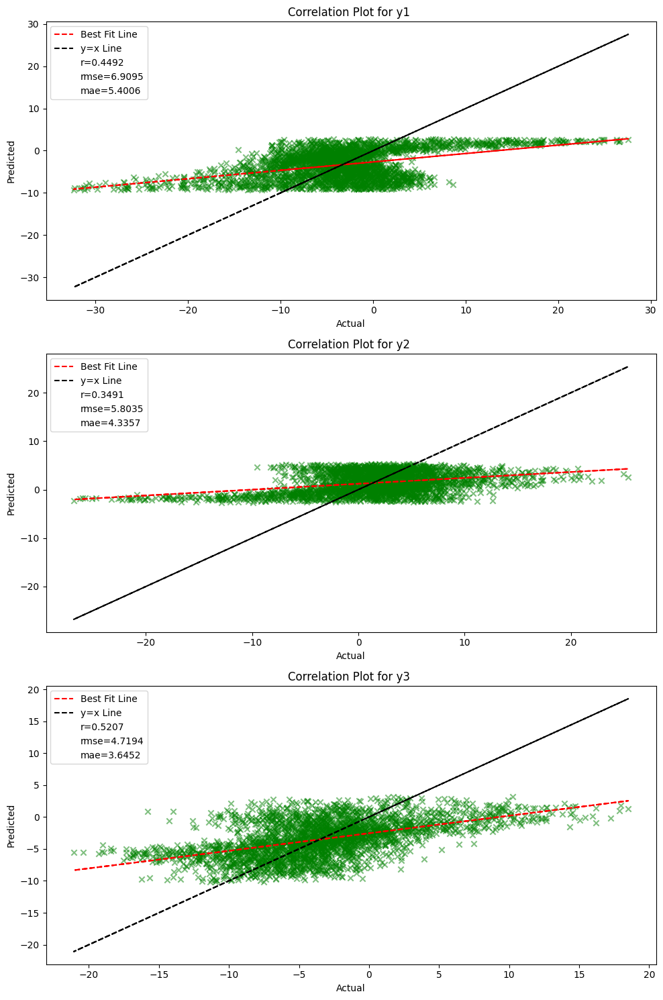

-3.9038*X1^2 + 0.1277*X1^1 + -3.9038*X2^2 + 2.6255*X2^1 + 0.1277 = y1'
-0.0473*X1^2 + -0.2338*X1^1 + -0.0473*X2^2 + -3.0364*X2^1 + -0.2338 = y2'
-3.1080*X1^2 + -2.8652*X1^1 + -3.1080*X2^2 + 1.9663*X2^1 + -2.8652 = y3'
['p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


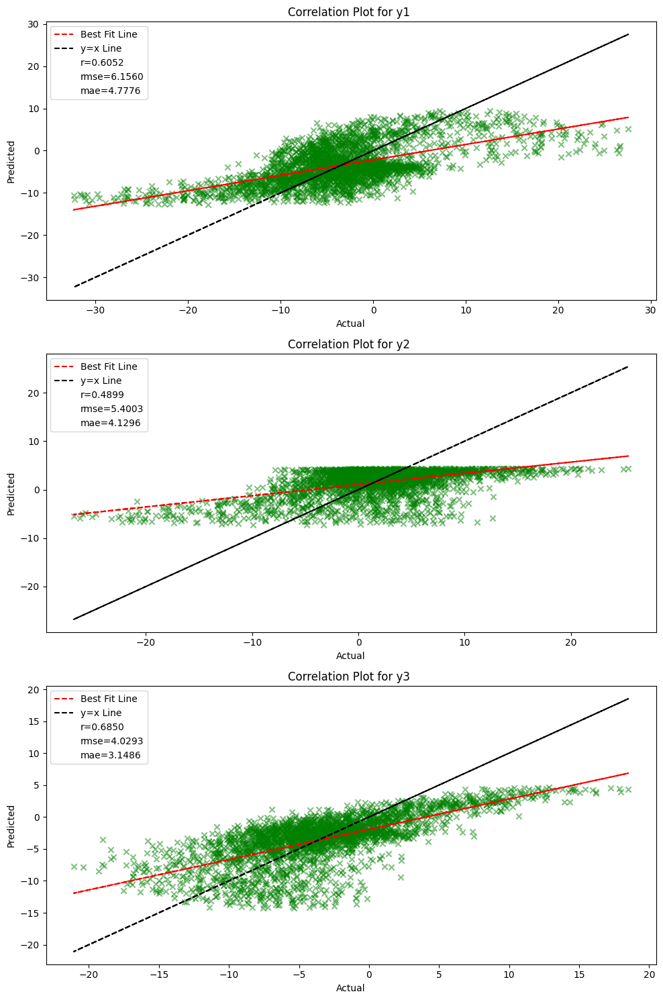

0.2831*X1^3 + -3.9446*X1^2 + -0.2515*X1^1 + 0.2831*X2^3 + -0.2515*X2^2 + 2.7057*X2^1 + -3.9446 = y1'
-4.9319*X1^3 + -0.0277*X1^2 + 6.4036*X1^1 + -4.9319*X2^3 + 6.4036*X2^2 + -3.0577*X2^1 + -0.0277 = y2'
1.7177*X1^3 + -3.0945*X1^2 + -5.1778*X1^1 + 1.7177*X2^3 + -5.1778*X2^2 + 1.9333*X2^1 + -3.0945 = y3'
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


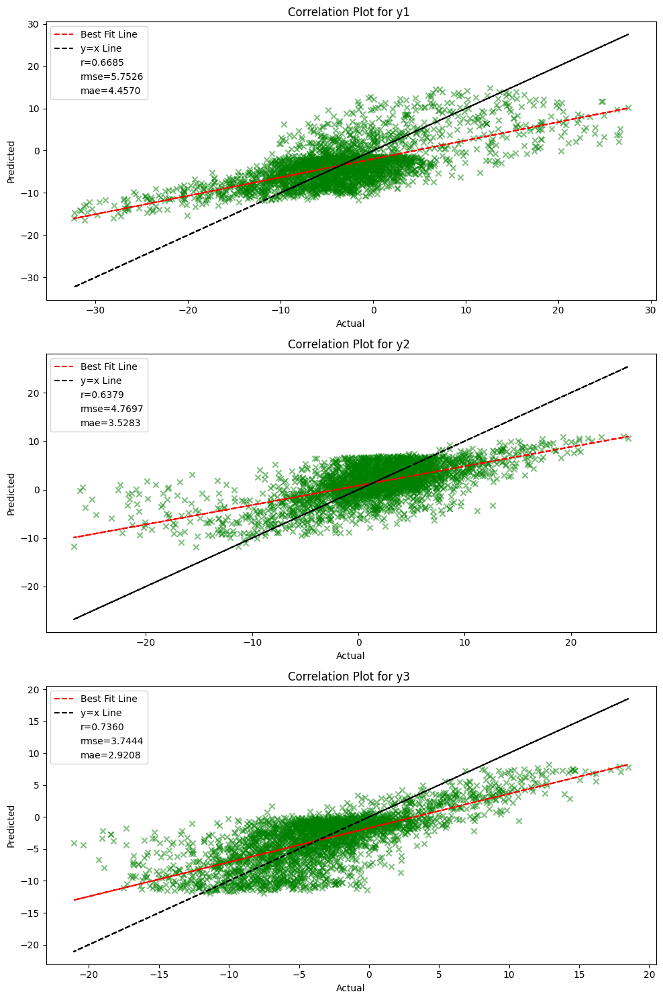

-0.0183*X1^4 + 0.2825*X1^3 + -3.9087*X1^2 + -0.2521*X1^1 + -0.0183*X2^4 + -3.9087*X2^3 + 0.1389*X2^2 + 2.4369*X2^1 + 0.2825 = y1'
-0.1516*X1^4 + -4.9317*X1^3 + 0.2656*X1^2 + 6.4053*X1^1 + -0.1516*X2^4 + 0.2656*X2^3 + -0.0876*X2^2 + -2.8895*X2^1 + -4.9317 = y2'
-0.0511*X1^4 + 1.7177*X1^3 + -2.9957*X1^2 + -5.1773*X1^1 + -0.0511*X2^4 + -2.9957*X2^3 + -0.0147*X2^2 + 1.9613*X2^1 + 1.7177 = y3'
['p>0.05', 'p>0.05', 'p<0.001', 'p>0.05', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p>0.05', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']


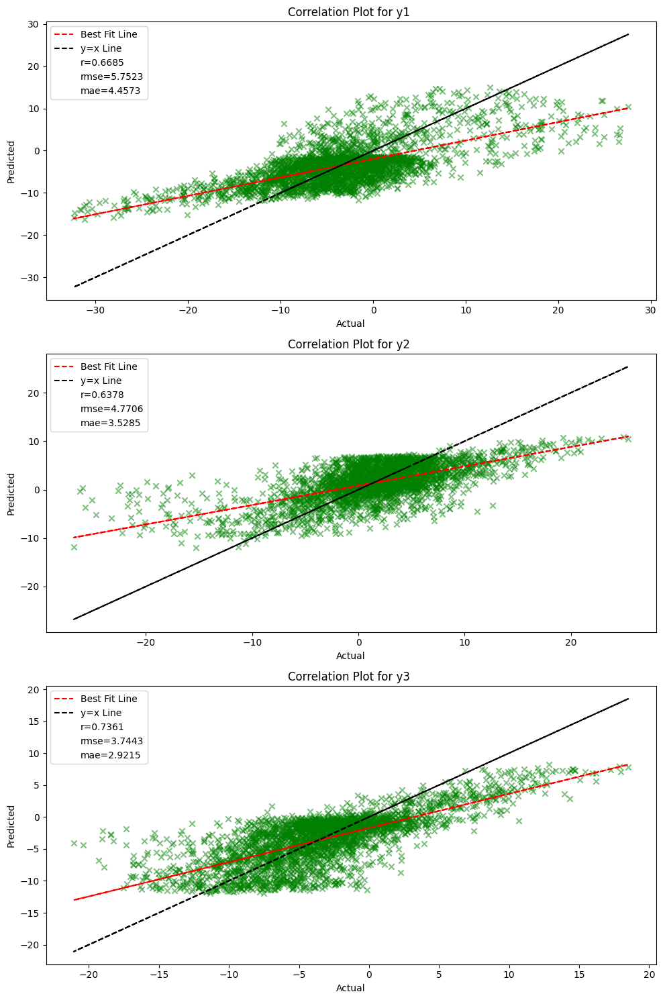

In [23]:
theta_lin = get_theta_poly(X_train, y_train, 1)
print_poly(theta_lin, 1)
plot_y(X_test, y_test, theta_lin, 1)

theta_quad = get_theta_poly(X_train, y_train, 2)
print_poly(theta_quad, 2)
plot_y(X_test, y_test, theta_quad, 2)

theta_cub = get_theta_poly(X_train, y_train, 3)
print_poly(theta_cub, 3)
plot_y(X_test, y_test, theta_cub, 3)

theta_biquad = get_theta_poly(X_train, y_train, 4)
print_poly(theta_biquad, 4)
plot_y(X_test, y_test, theta_biquad, 4)

- ***OBSERVATIONS***
    - For **$k=1$**:
        - It is seen that peasron correlation co-efficients for all y's are quite less denoting underfitting.
        - p-values suggest that 
            - For **$y1$** and **$y2$**, **$X2$** is significant as compared to **$X1$**
            - For **$y3$**, both **$X1$** and **$X2$** seem to be dominant.

    - For **$k=2$**:
        - It is seen that peasron correlation co-efficients increased for all y's as compared to linear poly.
        - p-values suggest that 
            - For **$y1$**, **$X1^2$**, **$X2^2$** and **$X2$** is significant compared to **$X1$**. 
            - For **$y2$**, **$X2^2$** and **$X2$** is significant as compared to its **$X1$** counterparts.
            - For **$y3$**, all terms, i.e., both **$X1$** and **$X2$** and their *quadratic terms* seem to be dominant.

    - For $k=3$:
        - It is seen that peasron correlation co-efficients increased a little for almost all y's as compared to quad poly.
        - p-values suggest that
            - For $y1$, **$X1^2$** and all **$X2$** terms are more significant compared to rest. 
            - For $y2$, $X1^3$, $X1$, $X1^2$, $X2^2$ and **$X2$** is significant as compared to rest. 
            - For $y3$, both $X1$ and $X2$ and their *quadratic* and *cubic* terms seem to be dominant.

    - For $k=4$:
        - It is seen that peasron correlation co-efficients have not changed for almost all y's as compared to cubic poly.
        - p-values suggest that 
            - $X^4$ *(biquadratic)* terms does seem to be dominant.
            - every other (non-)dominance / (in-)significance remains same as the cubic poly.

Emprical Risk(Training) at epoch 1: 88.34163265107925 | Emprical Risk(Validation) at epoch 1: 84.40763056911966
Emprical Risk(Training) at epoch 51: 51.70506927953356 | Emprical Risk(Validation) at epoch 51: 53.04950278071596
Emprical Risk(Training) at epoch 61: 51.698909578043796 | Emprical Risk(Validation) at epoch 61: 53.03630932276075


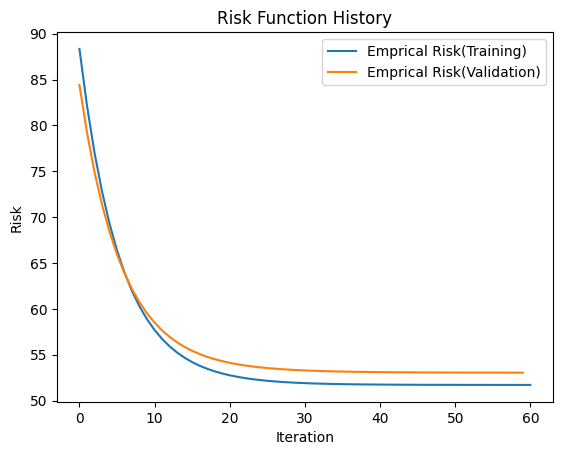

0.0676*X1^1 + 0.0676*X2^1 + 3.9353 = y1'
-0.2133*X1^1 + -0.2133*X2^1 + -2.4503 = y2'
-2.8779*X1^1 + -2.8779*X2^1 + -1.6637 = y3'
['p>0.05', 'p<0.001']
['p>0.05', 'p<0.001']
['p<0.001', 'p<0.001']


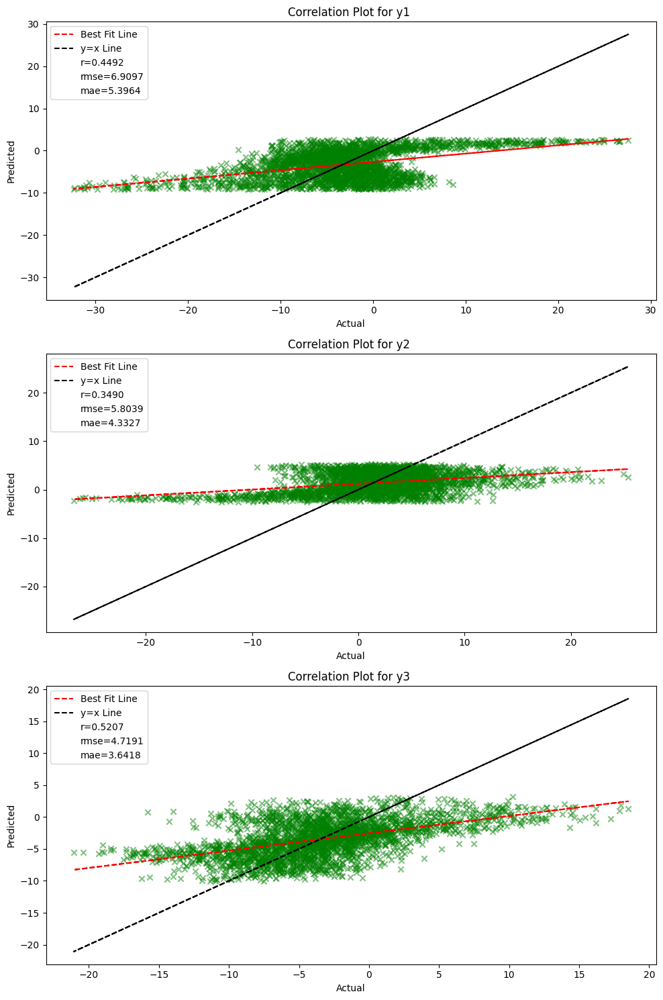

Emprical Risk(Training) at epoch 1: 92.00276770151658 | Emprical Risk(Validation) at epoch 1: 81.36210402476117
Emprical Risk(Training) at epoch 51: 41.99874303993868 | Emprical Risk(Validation) at epoch 51: 42.880537325696906
Emprical Risk(Training) at epoch 101: 41.636749537136616 | Emprical Risk(Validation) at epoch 101: 42.48142437878057
Emprical Risk(Training) at epoch 151: 41.59832553881 | Emprical Risk(Validation) at epoch 151: 42.43837574033042


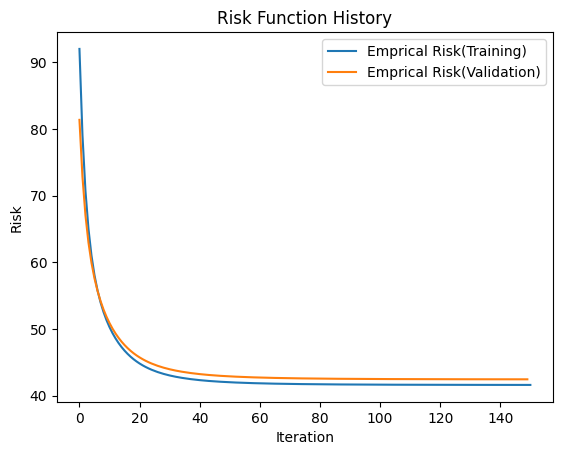

[[-3.93904213  0.0462252  -3.15180823]
 [ 0.12815567 -0.2351625  -2.86461164]
 [ 2.58396743 -2.94077742  1.91806378]
 [ 4.02546537 -2.53711219 -1.645673  ]
 [-2.23693689  3.46258468 -2.65026157]]
['p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


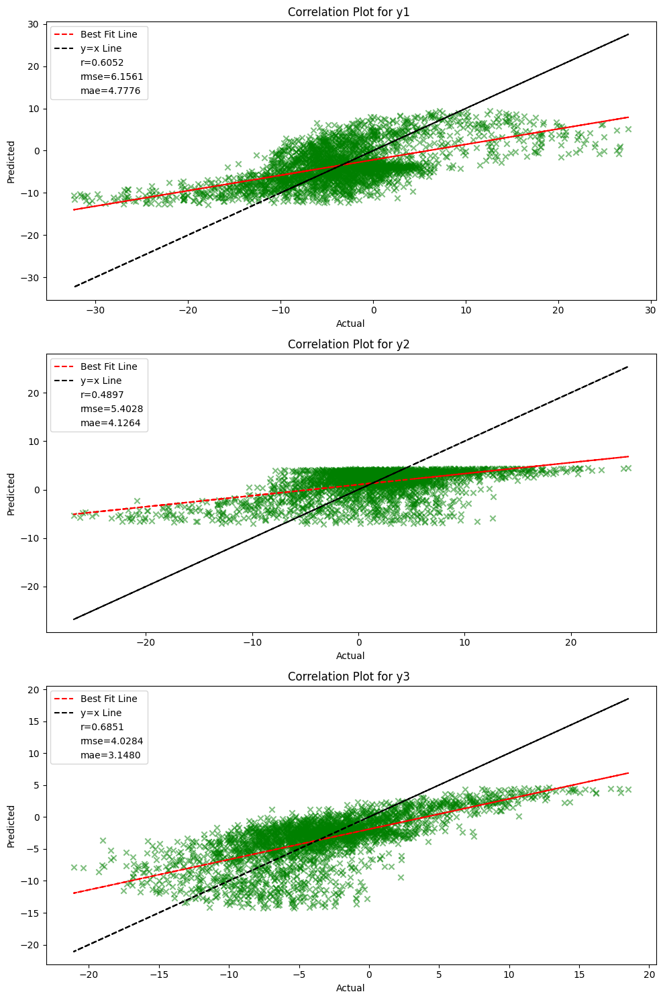

Emprical Risk(Training) at epoch 1: 95.80156387083255 | Emprical Risk(Validation) at epoch 1: 78.77939308848106
Emprical Risk(Training) at epoch 51: 37.922946890222484 | Emprical Risk(Validation) at epoch 51: 38.94898516226407
Emprical Risk(Training) at epoch 101: 36.33987930387171 | Emprical Risk(Validation) at epoch 101: 37.3591195462781
Emprical Risk(Training) at epoch 151: 35.78432885376813 | Emprical Risk(Validation) at epoch 151: 36.795599559815024
Emprical Risk(Training) at epoch 201: 35.561932698160156 | Emprical Risk(Validation) at epoch 201: 36.56784626952106
Emprical Risk(Training) at epoch 251: 35.46998308342721 | Emprical Risk(Validation) at epoch 251: 36.472476279591646
Emprical Risk(Training) at epoch 301: 35.431534499981495 | Emprical Risk(Validation) at epoch 301: 36.4318465154562
Emprical Risk(Training) at epoch 339: 35.41809888836066 | Emprical Risk(Validation) at epoch 339: 36.417566366217166


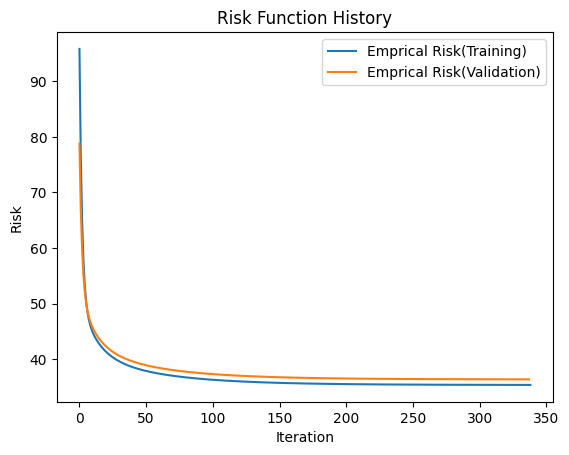

0.2771*X1^3 + -3.9443*X1^2 + -0.2423*X1^1 + 0.2771*X2^3 + -0.2423*X2^2 + 2.7028*X2^1 + -3.9443 = y1'
-4.7020*X1^3 + -0.0230*X1^2 + 6.0533*X1^1 + -4.7020*X2^3 + 6.0533*X2^2 + -3.0544*X2^1 + -0.0230 = y2'
1.5515*X1^3 + -3.0970*X1^2 + -4.9246*X1^1 + 1.5515*X2^3 + -4.9246*X2^2 + 1.9323*X2^1 + -3.0970 = y3'
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


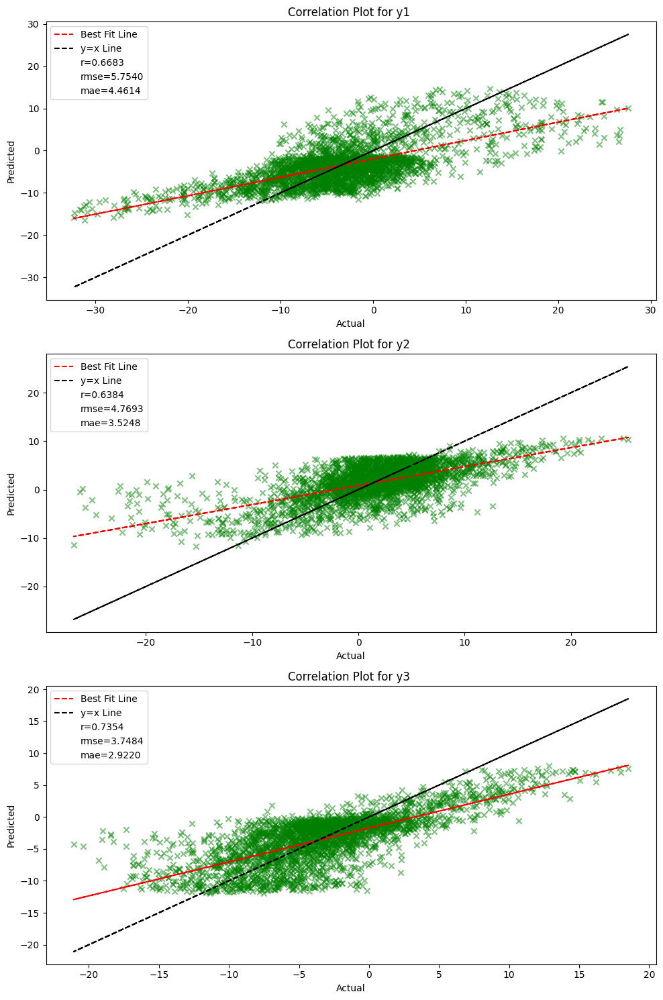

Emprical Risk(Training) at epoch 1: 112.69278504326874 | Emprical Risk(Validation) at epoch 1: 69.43889144096303
Emprical Risk(Training) at epoch 51: 37.767299624460264 | Emprical Risk(Validation) at epoch 51: 39.15225793903542
Emprical Risk(Training) at epoch 101: 36.528520675096644 | Emprical Risk(Validation) at epoch 101: 37.863178505211714
Emprical Risk(Training) at epoch 151: 35.9922834492139 | Emprical Risk(Validation) at epoch 151: 37.285841983650215
Emprical Risk(Training) at epoch 201: 35.73751643263372 | Emprical Risk(Validation) at epoch 201: 36.99356884259385
Emprical Risk(Training) at epoch 251: 35.608188937573786 | Emprical Risk(Validation) at epoch 251: 36.8305521563129
Emprical Risk(Training) at epoch 301: 35.537165407829626 | Emprical Risk(Validation) at epoch 301: 36.72992663541918
Emprical Risk(Training) at epoch 351: 35.49482893185138 | Emprical Risk(Validation) at epoch 351: 36.66188880711267
Emprical Risk(Training) at epoch 401: 35.467680922433686 | Emprical Risk(

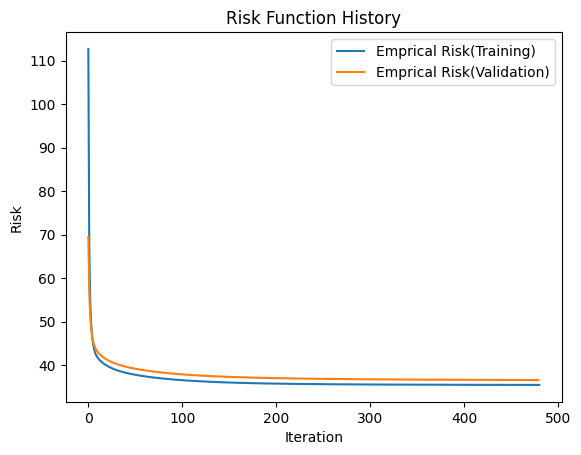

-0.3766*X1^4 + 0.2756*X1^3 + -3.1645*X1^2 + -0.2433*X1^1 + -0.3766*X2^4 + -3.1645*X2^3 + 0.4420*X2^2 + 1.8075*X2^1 + 0.2756 = y1'
-0.2502*X1^4 + -4.8649*X1^3 + 0.4797*X1^2 + 6.3084*X1^1 + -0.2502*X2^4 + 0.4797*X2^3 + -0.4754*X2^2 + -2.0775*X2^1 + -4.8649 = y2'
-0.3044*X1^4 + 1.6729*X1^3 + -2.4706*X1^2 + -5.1107*X1^1 + -0.3044*X2^4 + -2.4706*X2^3 + 0.2375*X2^2 + 1.4375*X2^1 + 1.6729 = y3'
['p>0.05', 'p>0.05', 'p<0.001', 'p>0.05', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.05', 'p>0.05', 'p<0.001', 'p<0.001']
['p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']


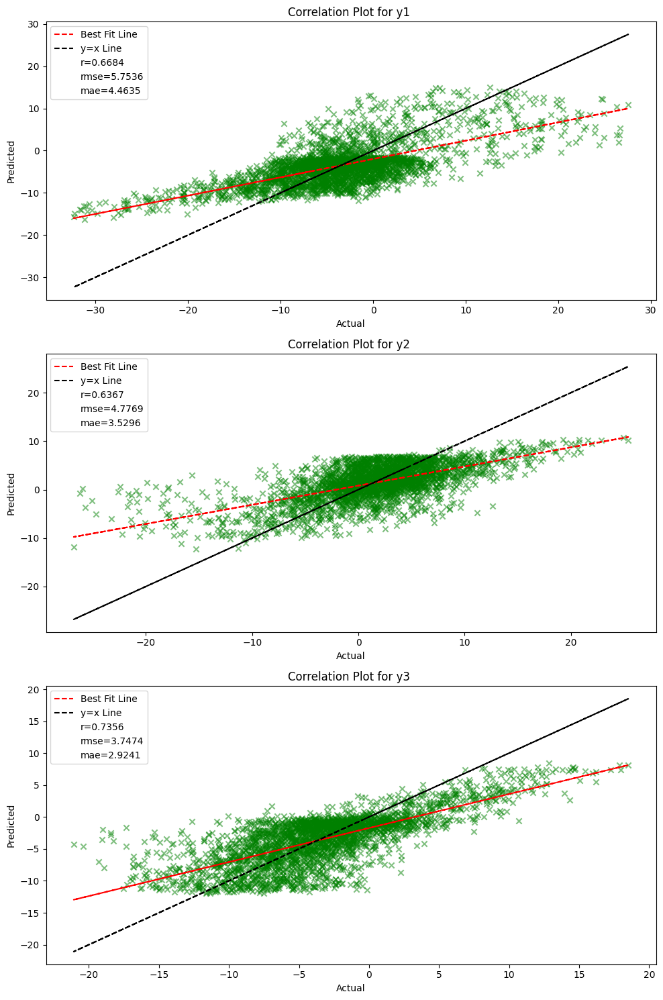

In [24]:
theta_gd_lin, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_lin)  
plot_y(X_test, y_test, theta_gd_lin, 1)

theta_gd_quad, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, 2)
plot_train_loss(train_losses, val_losses)
print(theta_gd_quad)
plot_y(X_test, y_test, theta_gd_quad, 2)

theta_gd_cub, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, 3)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_cub, 3)
plot_y(X_test, y_test, theta_gd_cub, 3)

theta_gd_biquad, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, 4)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_biquad, 4)
plot_y(X_test, y_test, theta_gd_biquad, 4)

- ***OBSERVATIONS***
    - *Similar observations* as in **closed form solution**
    - For **$k=1$**:
        - It is seen that peasron correlation co-efficients for all y's are quite less denoting underfitting.
        - p-values suggest that 
            - For **$y1$** and **$y2$**, **$X2$** is significant as compared to **$X1$**
            - For **$y3$**, both **$X1$** and **$X2$** seem to be dominant.

    - For **$k=2$**:
        - It is seen that peasron correlation co-efficients increased for all y's as compared to linear poly.
        - p-values suggest that 
            - For **$y1$**, **$X1^2$**, **$X2^2$** and **$X2$** is significant compared to **$X1$**. 
            - For **$y2$**, **$X2^2$** and **$X2$** is significant as compared to its **$X1$** counterparts.
            - For **$y3$**, all terms, i.e., both **$X1$** and **$X2$** and their *quadratic terms* seem to be dominant.

    - For $k=3$:
        - It is seen that peasron correlation co-efficients increased a little for almost all y's as compared to quad poly.
        - p-values suggest that
            - For $y1$, **$X1^2$** and all **$X2$** terms are more significant compared to rest. 
            - For $y2$, $X1^3$, $X1$, $X1^2$, $X2^2$ and **$X2$** is significant as compared to rest. 
            - For $y3$, both $X1$ and $X2$ and their *quadratic* and *cubic* terms seem to be dominant.

    - For $k=4$:
        - It is seen that peasron correlation co-efficients have not changed for almost all y's as compared to cubic poly.
        - p-values suggest that 
            - $X^4$ *(biquadratic)* terms does not seem to be dominant.
            - every other (non-)dominance / (in-)significance remains same as the cubic poly.

Emprical Risk(Training) at epoch 1: 84.04109944650996 | Emprical Risk(Validation) at epoch 1: 73.78746518809342
Emprical Risk(Training) at epoch 51: 47.14039884486837 | Emprical Risk(Validation) at epoch 51: 48.11686403000168
Emprical Risk(Training) at epoch 101: 47.58689316521373 | Emprical Risk(Validation) at epoch 101: 48.51169817522923
Emprical Risk(Training) at epoch 148: 47.75263307187785 |  Emprical Risk(Validation) at epoch 148: 48.667003953913444


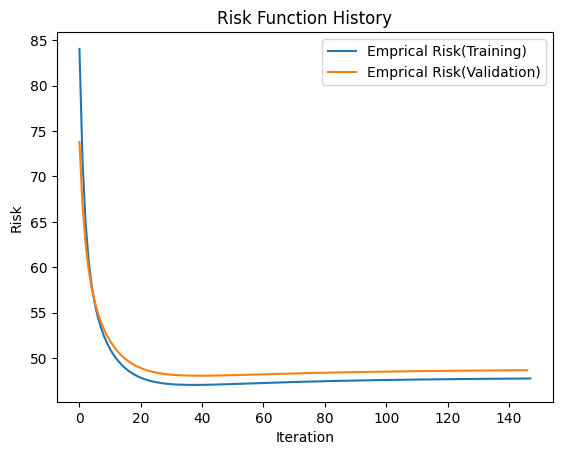

-3.6893*X1^2 + 0.7416*X1^1 + -3.6893*X2^2 + 2.8594*X2^1 + 0.7416 = y1'
0.2926*X1^2 + 0.3783*X1^1 + 0.2926*X2^2 + -2.6674*X2^1 + 0.3783 = y2'
-2.9082*X1^2 + -2.2511*X1^1 + -2.9082*X2^2 + 2.1881*X2^1 + -2.2511 = y3'
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.05', 'p<0.01', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


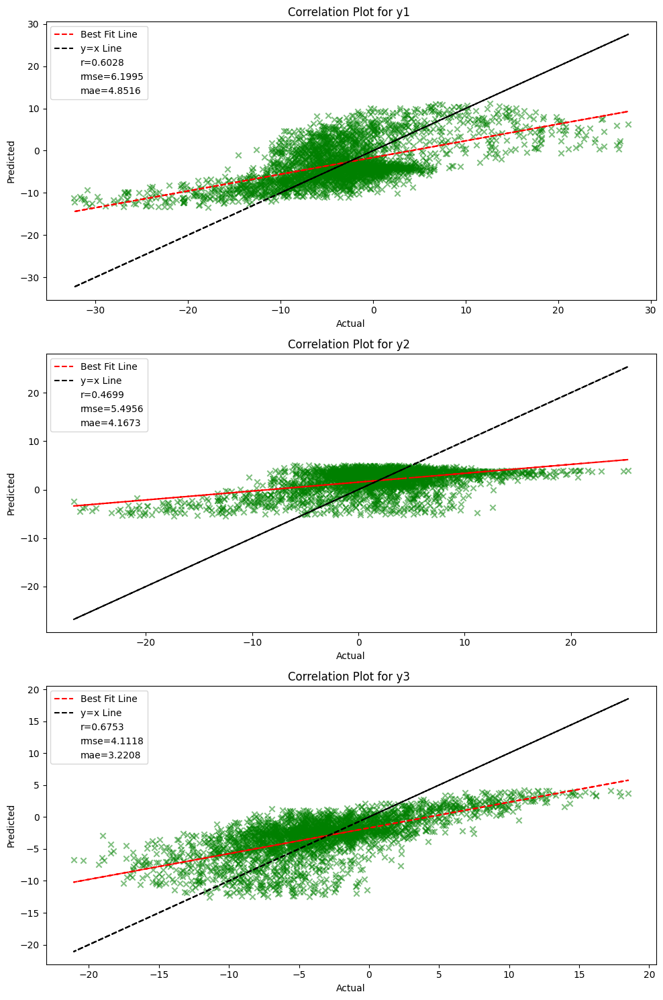

Emprical Risk(Training) at epoch 1: 77.05240883485777 | Emprical Risk(Validation) at epoch 1: 65.72381140265176
Emprical Risk(Training) at epoch 51: 42.5989880787821 | Emprical Risk(Validation) at epoch 51: 43.73628186416648
Emprical Risk(Training) at epoch 101: 43.10415030341177 | Emprical Risk(Validation) at epoch 101: 44.19825332167352
Emprical Risk(Training) at epoch 151: 43.9766737643299 | Emprical Risk(Validation) at epoch 151: 45.03909323567924
Emprical Risk(Training) at epoch 201: 44.750064809876804 | Emprical Risk(Validation) at epoch 201: 45.79127348883067
Emprical Risk(Training) at epoch 251: 45.33507041054067 | Emprical Risk(Validation) at epoch 251: 46.362530775239044
Emprical Risk(Training) at epoch 301: 45.74795760054592 | Emprical Risk(Validation) at epoch 301: 46.76666220731978
Emprical Risk(Training) at epoch 338: 45.96641351718374 |  Emprical Risk(Validation) at epoch 338: 46.975785604045804


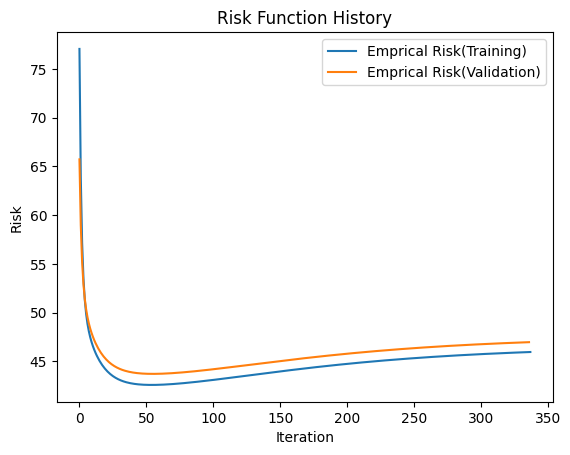

-0.2330*X1^3 + -3.7272*X1^2 + 0.9684*X1^1 + -0.2330*X2^3 + 0.9684*X2^2 + 2.9245*X2^1 + -3.7272 = y1'
-5.1931*X1^3 + 0.1941*X1^2 + 7.2352*X1^1 + -5.1931*X2^3 + 7.2352*X2^2 + -2.8326*X2^1 + 0.1941 = y2'
1.0645*X1^3 + -2.8798*X1^2 + -3.7491*X1^1 + 1.0645*X2^3 + -3.7491*X2^2 + 2.1539*X2^1 + -2.8798 = y3'
['p>0.05', 'p<0.001', 'p<0.01', 'p<0.001', 'p<0.001', 'p>0.05']
['p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


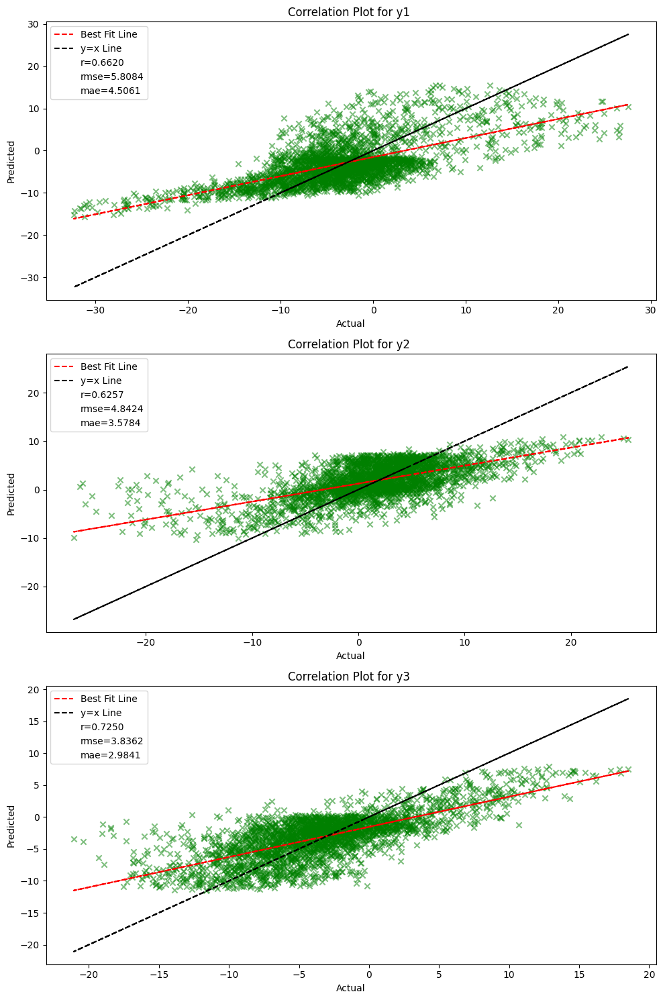

Emprical Risk(Training) at epoch 1: 91.7557833185868 | Emprical Risk(Validation) at epoch 1: 60.77893854602012
Emprical Risk(Training) at epoch 51: 41.29670049023004 | Emprical Risk(Validation) at epoch 51: 42.76402632985907
Emprical Risk(Training) at epoch 101: 41.655510746629346 | Emprical Risk(Validation) at epoch 101: 43.0571516986921
Emprical Risk(Training) at epoch 151: 42.470151388660376 | Emprical Risk(Validation) at epoch 151: 43.823678342087504
Emprical Risk(Training) at epoch 201: 43.2834643302874 | Emprical Risk(Validation) at epoch 201: 44.59769660694042
Emprical Risk(Training) at epoch 251: 43.96263026739583 | Emprical Risk(Validation) at epoch 251: 45.244839018639986
Emprical Risk(Training) at epoch 301: 44.494668819047256 | Emprical Risk(Validation) at epoch 301: 45.75093259760541
Emprical Risk(Training) at epoch 351: 44.9033183176664 | Emprical Risk(Validation) at epoch 351: 46.138474298322485
Emprical Risk(Training) at epoch 401: 45.217529464536305 | Emprical Risk(Val

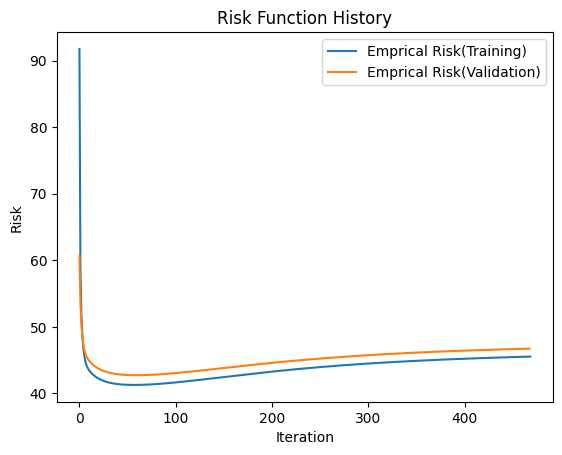

-1.0771*X1^4 + -0.1089*X1^3 + -1.6989*X1^2 + 0.6696*X1^1 + -1.0771*X2^4 + -1.6989*X2^3 + -0.3503*X2^2 + 3.4633*X2^1 + -0.1089 = y1'
-0.9957*X1^4 + -5.2401*X1^3 + 2.0385*X1^2 + 7.2067*X1^1 + -0.9957*X2^4 + 2.0385*X2^3 + -1.2188*X2^2 + -0.5232*X2^1 + -5.2401 = y2'
-1.0272*X1^4 + 1.2825*X1^3 + -0.9596*X1^2 + -4.1897*X1^1 + -1.0272*X2^4 + -0.9596*X2^3 + -0.4902*X2^2 + 2.9588*X2^1 + 1.2825 = y3'
['p<0.001', 'p>0.05', 'p<0.001', 'p<0.05', 'p>0.05', 'p<0.001', 'p<0.001', 'p>0.05']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.01', 'p>0.05', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.01', 'p<0.001', 'p<0.01', 'p<0.001', 'p<0.001', 'p<0.001']


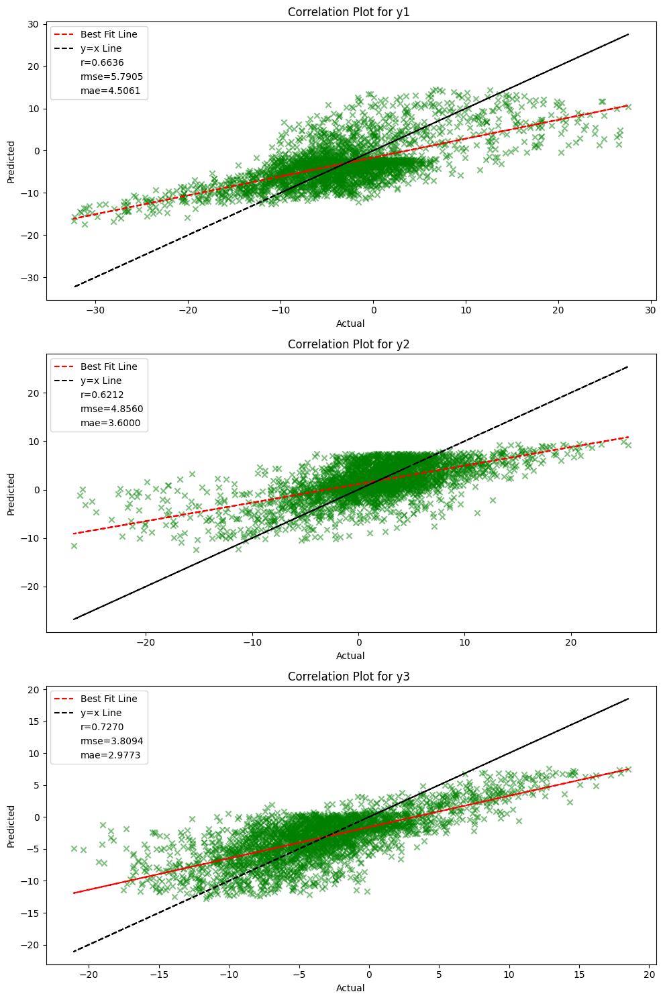

In [25]:
theta_gd_quad_reg_l2, train_losses, val_losses = grad_desc_sq_err_reg_L2(
    X_train, y_train, X_val, y_val, 2)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_quad_reg_l2, 2)
plot_y(X_test, y_test, theta_gd_quad_reg_l2, 2)


theta_gd_cub_reg_l2, train_losses, val_losses = grad_desc_sq_err_reg_L2(
    X_train, y_train, X_val, y_val, 3)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_cub_reg_l2, 3)
plot_y(X_test, y_test, theta_gd_cub_reg_l2, 3)


theta_gd_biquad_reg_l2, train_losses, val_losses = grad_desc_sq_err_reg_L2(
    X_train, y_train, X_val, y_val, 4)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_biquad_reg_l2, 4)
plot_y(X_test, y_test, theta_gd_biquad_reg_l2, 4)

- ***OBSERVATIONS***
    - Almost Similar performance and metrics when compared with non-regularized GD.
    - For **$k=2$**:
        - It is seen that peasron correlation co-efficients remains same for all y's as compared to non-regularized GD.
        - p-values suggest that 
            - For **$y2$**, **$X2^2$** and **$X2$** is significant as compared to its **$X1$** counterparts.
            - For **$y3$** and **$y1$**, all terms, i.e., both **$X1$** and **$X2$** and their *quadratic terms* seem to be dominant.

    - For $k=3$:
        - It is seen that peasron correlation co-efficients remains the same for almost all y's as compare to non-regularized GD.
        - p-values suggest that
            - For $y1$, **$X1^3$** and **$X2$** are less significant compared to rest. 
            - For $y2$, $X1^2$, is in-significant as compared to rest. 
            - For $y3$, both $X1$ and $X2$ and their *quadratic* and *cubic* terms seem to be dominant.

    - For $k=4$:
        - It is seen that peasron correlation co-efficients have not changed for almost all y's as compared to cubic poly.
        - p-values suggest that 
            - $X1^4$ *(biquadratic)* terms does seem to be dominant for all y's.
            - $X2^4$ *(biquadratic)* terms does not seem to be dominant for all y1.
            - most other (non-)dominance / (in-)significance remains same as the cubic poly.

Emprical Risk(Training) at epoch 1: 80.37966555808066 | Emprical Risk(Validation) at epoch 1: 72.87161807865694
Emprical Risk(Training) at epoch 51: 45.175647553889014 | Emprical Risk(Validation) at epoch 51: 46.1253023435932
Emprical Risk(Training) at epoch 101: 44.93411034607438 | Emprical Risk(Validation) at epoch 101: 45.846544369484256
Emprical Risk(Training) at epoch 106: 44.92870584730322 |  Emprical Risk(Validation) at epoch 106: 45.840790494437314


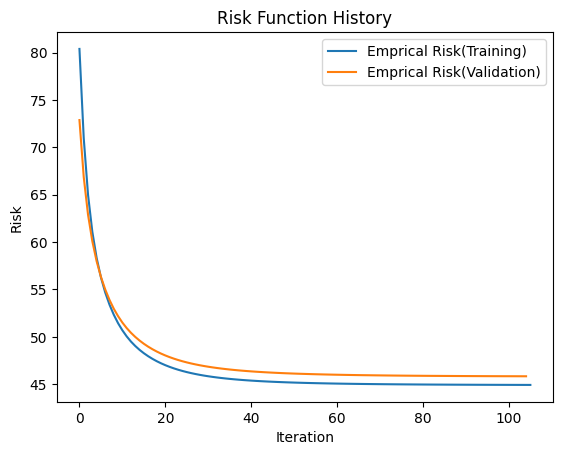

-3.8939*X1^2 + 0.0118*X1^1 + -3.8939*X2^2 + 2.1395*X2^1 + 0.0118 = y1'
0.0790*X1^2 + -0.0998*X1^1 + 0.0790*X2^2 + -2.4425*X2^1 + -0.0998 = y2'
-3.1030*X1^2 + -2.7310*X1^1 + -3.1030*X2^2 + 1.5050*X2^1 + -2.7310 = y3'
['p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p>0.05', 'p>0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


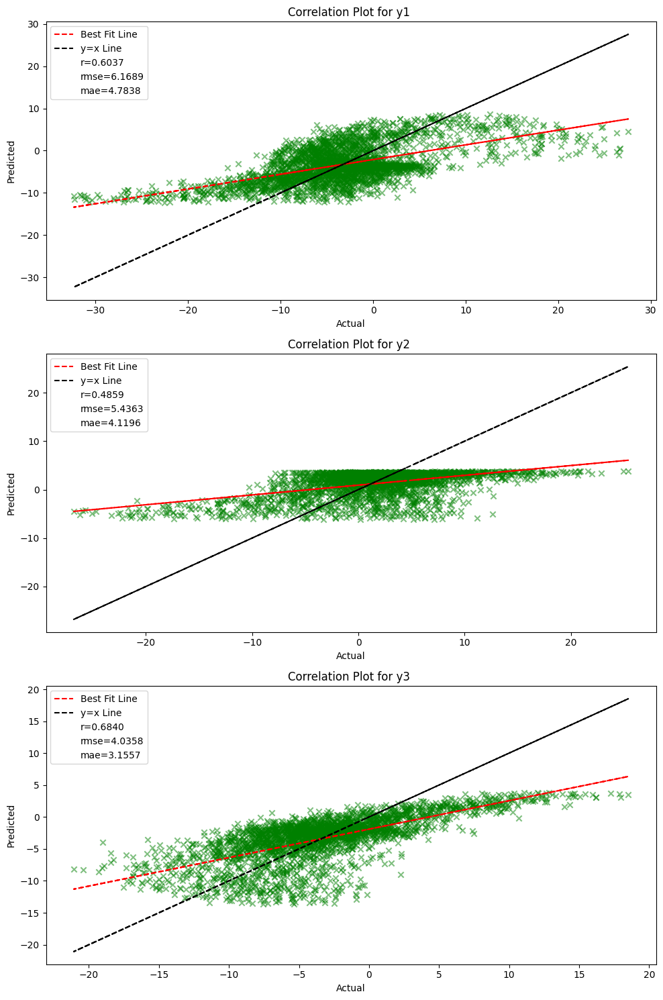

Emprical Risk(Training) at epoch 1: 82.59134085078415 | Emprical Risk(Validation) at epoch 1: 70.60861544831418
Emprical Risk(Training) at epoch 51: 41.526659243951286 | Emprical Risk(Validation) at epoch 51: 42.5972469131696
Emprical Risk(Training) at epoch 101: 40.53461307969483 | Emprical Risk(Validation) at epoch 101: 41.59183888695459
Emprical Risk(Training) at epoch 151: 40.272864136624676 | Emprical Risk(Validation) at epoch 151: 41.316574034180896
Emprical Risk(Training) at epoch 201: 40.17248848225334 | Emprical Risk(Validation) at epoch 201: 41.20987137031204
Emprical Risk(Training) at epoch 251: 40.132153159166506 | Emprical Risk(Validation) at epoch 251: 41.16529104061884
Emprical Risk(Training) at epoch 294: 40.11629440829674 |  Emprical Risk(Validation) at epoch 294: 41.14733409436109


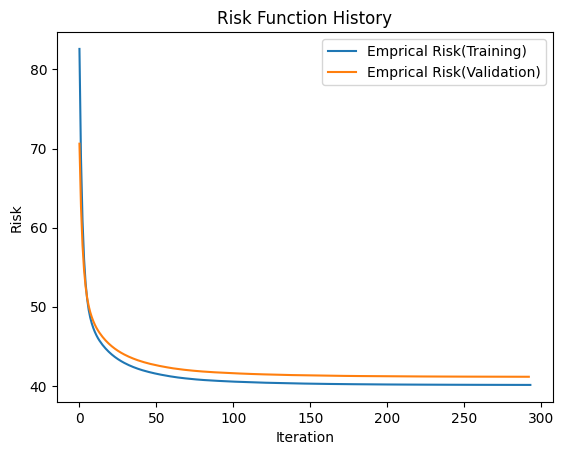

0.0604*X1^3 + -3.8773*X1^2 + 0.0035*X1^1 + 0.0604*X2^3 + 0.0035*X2^2 + 2.3046*X2^1 + -3.8773 = y1'
-3.7555*X1^3 + 0.0028*X1^2 + 4.6368*X1^1 + -3.7555*X2^3 + 4.6368*X2^2 + -2.6659*X2^1 + 0.0028 = y2'
0.7023*X1^3 + -3.0451*X1^2 + -3.6574*X1^1 + 0.7023*X2^3 + -3.6574*X2^2 + 1.5545*X2^1 + -3.0451 = y3'
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p>0.05']
['p<0.001', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p>0.05']


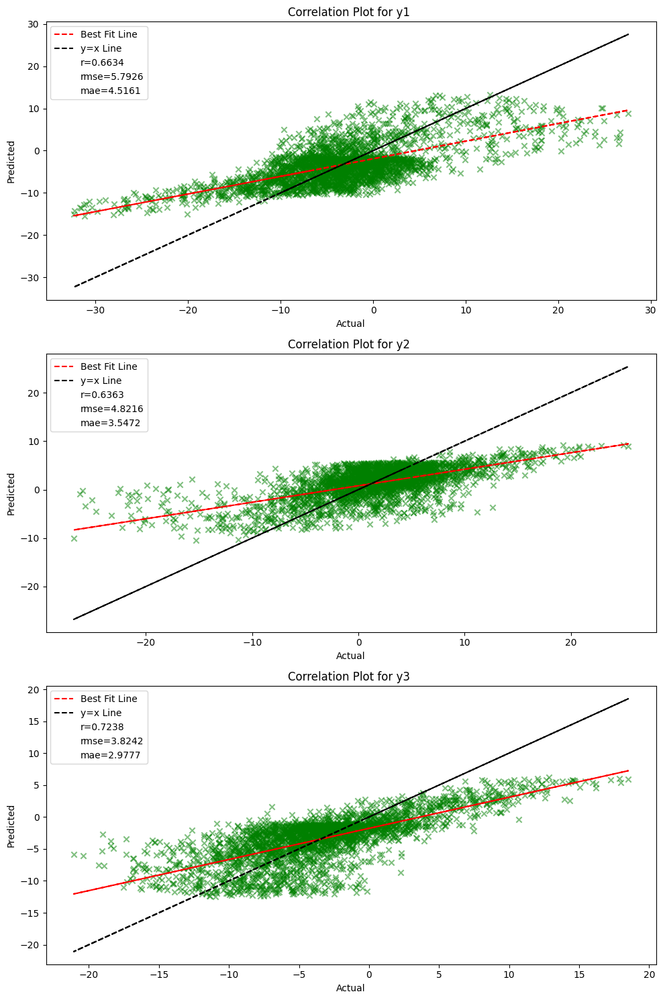

Emprical Risk(Training) at epoch 1: 87.5793130112277 | Emprical Risk(Validation) at epoch 1: 63.860423935400334
Emprical Risk(Training) at epoch 51: 41.09342889506354 | Emprical Risk(Validation) at epoch 51: 42.54867021597901
Emprical Risk(Training) at epoch 101: 40.32789289327456 | Emprical Risk(Validation) at epoch 101: 41.750468137684614
Emprical Risk(Training) at epoch 151: 40.07997749142911 | Emprical Risk(Validation) at epoch 151: 41.47361651245315
Emprical Risk(Training) at epoch 201: 39.97207273766631 | Emprical Risk(Validation) at epoch 201: 41.34435147958003
Emprical Risk(Training) at epoch 251: 39.92222077096877 | Emprical Risk(Validation) at epoch 251: 41.27681396809117
Emprical Risk(Training) at epoch 301: 39.89824084265182 | Emprical Risk(Validation) at epoch 301: 41.23558998301122
Emprical Risk(Training) at epoch 351: 39.88587620442788 | Emprical Risk(Validation) at epoch 351: 41.20963322075769
Emprical Risk(Training) at epoch 401: 39.878887962834355 | Emprical Risk(Vali

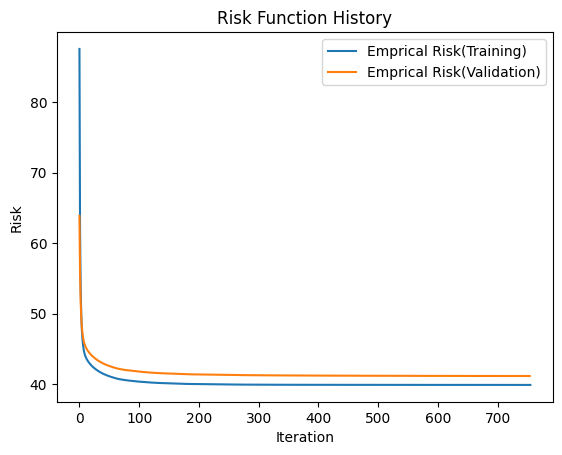

-0.5120*X1^4 + 0.0550*X1^3 + -2.8632*X1^2 + 0.0030*X1^1 + -0.5120*X2^4 + -2.8632*X2^3 + 1.0496*X2^2 + 0.2726*X2^1 + 0.0550 = y1'
0.0026*X1^4 + -4.0266*X1^3 + 0.0017*X1^2 + 5.0609*X1^1 + 0.0026*X2^4 + 0.0017*X2^3 + -1.0519*X2^2 + -0.6272*X2^1 + -4.0266 = y2'
-0.4614*X1^4 + 0.8142*X1^3 + -2.1361*X1^2 + -3.8336*X1^1 + -0.4614*X2^4 + -2.1361*X2^3 + 0.8097*X2^2 + 0.0053*X2^1 + 0.8142 = y3'
['p<0.05', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p>0.05', 'p>0.05']
['p>0.05', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001', 'p>0.05', 'p>0.05', 'p<0.001']
['p<0.01', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p>0.05', 'p>0.05']


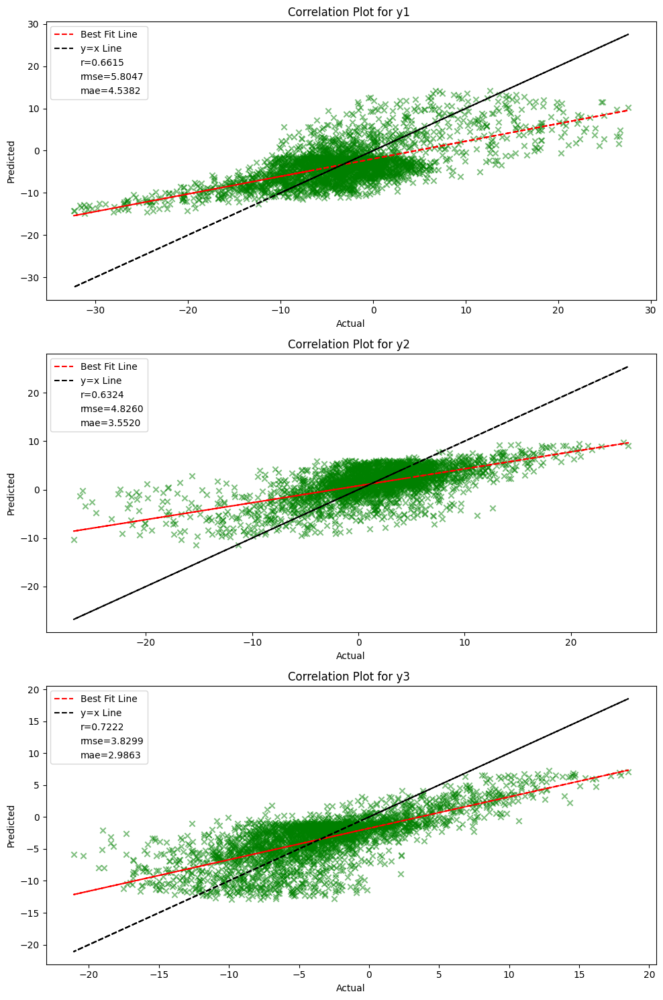

In [26]:
theta_gd_quad_reg_l1, train_losses, val_losses = grad_desc_sq_err_reg_L1(
    X_train, y_train, X_val, y_val, 2)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_quad_reg_l1, 2)
plot_y(X_test, y_test, theta_gd_quad_reg_l1, 2)


theta_gd_cub_reg_l1, train_losses, val_losses = grad_desc_sq_err_reg_L1(
    X_train, y_train, X_val, y_val, 3)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_cub_reg_l1, 3)
plot_y(X_test, y_test, theta_gd_cub_reg_l1, 3)


theta_gd_biquad_reg_l1, train_losses, val_losses = grad_desc_sq_err_reg_L1(
    X_train, y_train, X_val, y_val, 4)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_biquad_reg_l1, 4)
plot_y(X_test, y_test, theta_gd_biquad_reg_l1, 4)

- ***OBSERVATIONS***
    - Almost Similar performance and metrics when compared with non-regularized GD.
    - For **$k=2$**:
        - It is seen that peasron correlation co-efficients decreased for all y's as compared to non-regularized GD.
        - p-values suggest that 
            - For **$y1$**, **$X1$** is least significant as compared to others.
            - For **$y2$**, **$X2^2$** and **$X2$** is significant as compared to its **$X1$** counterparts.
            - For **$y3$** and **$y1$**, all terms, i.e., both **$X1$** and **$X2$** and their *quadratic terms* seem to be dominant.

    - For $k=3$:
        - It is seen that peasron correlation co-efficients remains the same for almost all y's as compare to non-regularized GD.
        - p-values suggest that
            - For $y1$, **$X1^3$**, $X1$ and **$X2$** are less significant compared to rest. 
            - For $y2$, $X1$ and $X2^3$ are in-significant as compared to rest. 
            - For $y3$, both $X1$ and $X2$ and their *quadratic* and *cubic* terms seem to be dominant.

    - For $k=4$:
        - It is seen that peasron correlation co-efficients have not changed for almost all y's as compared to cubic poly.
        - p-values suggest that 
            - $X^4$ *(biquadratic)* terms does seem to be dominant for $y2$ and $y3$.
            - every other (non-)dominance / (in-)significance remains same as the cubic poly.

## Q3

### Pre-processing

In [27]:
# Load the dataset
data_path = './datasets/regression_data_uni_group_12_train.txt'

# Adjusting the data loading process to skip the header row
data = np.loadtxt(data_path, skiprows=1)
np.random.seed(42)  # For reproducibility
np.random.shuffle(data)  # Randomly shuffle the data

# Separate features and targets again
X = data[:, :5]  # Features (sensor readings)
y = data[:, 5:]  # Targets (y position)

split_idx1 = int(X.shape[0] * 0.8)
split_idx2 = split_idx1 + int((X.shape[0] - split_idx1) * 0.5)

X_train = X[:split_idx1]
X_val = X[split_idx1:split_idx2]
X_test = X[split_idx2:]
y_train = y[:split_idx1]
y_val = y[split_idx1:split_idx2]
y_test = y[split_idx2:]

mean_X = np.mean(X_train, axis=0)
std_dev_X = np.std(X_train, axis=0)
norm2_X = np.linalg.norm(X_train, axis=0)

mean_y = np.mean(y_train, axis=0)
std_dev_y = np.std(y_train, axis=0)
norm2_y = np.linalg.norm(y_train, axis=0)

X_train_norm_2 = X_train / norm2_X
y_train_norm_2 = y_train / norm2_y

X_val_norm_2 = X_val / norm2_X
y_val_norm_2 = y_val / norm2_y

X_test_norm_2 = X_test / norm2_X
y_test_norm_2 = y_test / norm2_y

X_train_norm_zs = (X_train - mean_X) / std_dev_X
y_train_norm_zs = (y_train - mean_y) / std_dev_y

X_val_norm_zs = (X_val - mean_X) / std_dev_X
y_val_norm_zs = (y_val - mean_y) / std_dev_y

X_test_norm_zs = (X_test - mean_X) / std_dev_X
y_test_norm_zs = (y_test - mean_y) / std_dev_y

### $X,k$  -> $\phi(f(X))$; $f(X) = \sigma(x) | (1+\tanh(x))/2 | G(x) | L(x) | I(x), \phi(X) = [X:1]$

In [28]:
def phi_x(X):
    return np.c_[X, np.ones((X.shape[0], 1))]


def identity(X):
    return X


def sigmoid(X):
    return 1 / (1 + np.exp(-X))


def gaussian(X, meu=0, sigma=1):
    return 1 / (sigma * np.sqrt(2 * np.pi)) * np.exp(-0.5 * ((X-meu)/sigma)**2)


def laplacian(X, meu=0, sigma=1):
    return 1 / (2 * sigma) * np.exp(-(np.absolute(X-meu)/sigma))


def tanh_0_1(X):
    return (1 + np.tanh(X)) / 2

### Weights and biases using closed form eq of ERM

In [29]:
def get_theta(X, y, f):
    # Add a bias term (column of ones) to X for the intercept
    phi_X = phi_x(f(X))

    # Solve the normal equation again: theta = (X_b.T * X_b)^(-1) * X_b.T * y
    theta = np.linalg.inv(phi_X.T.dot(phi_X)).dot(phi_X.T).dot(y)

    return theta

### Print the linear relation b/w each $y$ and and the features($X1$-$X5$)

In [30]:
def print_poly(theta, f_name, norm=""):
    m, n = theta.shape
    norm = "_" + norm if norm != "" else ""
    for i in range(n):
        poly = ""
        for j in range(m):
            poly += f"{theta[j][i]:.4f}*{f_name}(X{j+1}{norm}) + "
        print(poly + f"{theta[j][i]:.4f} = y{norm}'")

### Plot $y$ & $y_{pred}$ with metrics

In [31]:
def plot_y(X, y, theta, f, norm=""):
   # Adjusting the correlation plots to include the best fit line and y=x line
    
    X_b = phi_x(f(X))
    y_pred = np.matmul(X_b, theta)

    pc, rmse, mae = get_metrics(y, y_pred)

    plt.figure(figsize=(10, 15))

    for i in range(y.shape[1]):
        # Scatter plot for actual vs predicted
        plt.subplot(3, 1, i+1)
        plt.scatter(y[:, i], y_pred[:, i], alpha=0.5,
                    color='green', marker='x')

        # Best fit line (red line)
        m, b = np.polyfit(y[:, i], y_pred[:, i], 1)  # m = slope, b = intercept
        plt.plot(y[:, i], m * y[:, i] + b, 'r--', label='Best Fit Line')

        # y=x line (black dotted line)
        plt.plot(y[:, i], y[:, i], 'k--', label='y=x Line')

        # Calculate Standard Error
        errors = y[:, i] - y_pred[:, i]
        s_sq = errors.T @ errors / (X.shape[0] - len(theta) - 1)
        SE_Theta = np.sqrt(np.diag(np.linalg.inv(X_b[:, :-1].T @ X_b[:, :-1]) * s_sq))

        # Step 3: Calculate t-Statistic for each coefficient
        t_stats = theta[:, i].flatten()[:-1] / SE_Theta

        # Determine the p-value approximation based on the refined critical values
        # Default if t-statistic is below the lowest threshold
        p_value = ["p>0.05"]*len(t_stats)
        for j, t in enumerate(t_stats):
            for p, t_crit in lookup_table_refined.items():
                if abs(t) > t_crit:
                    p_value[j] = f"p<{p}"

        print(p_value)

        # Creating custom legend handles
        pc_handle = mlines.Line2D([], [], color='none', marker='None',
                                  label=f'r={pc[i]:.4f}')
        rmse_handle = mlines.Line2D([], [], color='none', marker='None',
                                    label=f'rmse={rmse[i]:.4f}')
        mae_handle = mlines.Line2D([], [], color='none', marker='None',
                                   label=f'mae={mae[i]:.4f}')

        # Adding custom legend handles to the existing legend handles
        handles, labels = plt.gca().get_legend_handles_labels()
        handles.extend([pc_handle, rmse_handle, mae_handle])

        plt.xlabel('Actual')
        plt.ylabel('Predicted')
        plt.title(f'Correlation Plot for y {norm}')

        # Creating the legend with the custom handles
        plt.legend(handles=handles)

    plt.tight_layout()
    plt.show()

### Gradient Descent

In [32]:
def h(X, f):
    return phi_x(f(X))


def L(a, b):
    return np.square(np.linalg.norm(a - b))


def R(X, y, theta):
    return 1/(2*y.shape[0]) * np.sum(L(np.matmul(X, theta), y))


def dR_dtheta(X, y, theta):
    return 1/(y.shape[0]) * np.matmul(X.T, (np.matmul(X, theta)) - y)


def grad_desc_sq_err(X, y, X_, y_, f, lr=0.1, epochs=10000, eps=0.05):
    train_losses = []
    val_losses = []
    h_X = h(X, f)
    h_X_ = h(X_, f)
    theta = np.random.rand(h_X.shape[1], y.shape[1])
    for i in range(epochs):
        train_losses.append(R(h_X, y, theta))
        grad_theta = dR_dtheta(h_X, y, theta)
        if np.linalg.norm(grad_theta) < eps:
            break
        theta -= lr * grad_theta

        val_losses.append(R(h_X_, y_, theta))
        if (i) % 50 == 0:
            print(
                f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} | Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")

    print(
        f"Emprical Risk(Training) at epoch {i+1}: {train_losses[-1]} |  Emprical Risk(Validation) at epoch {i+1}: {val_losses[-1]}")
    return theta, np.array(train_losses), np.array(val_losses)


### Testing Closed form eq. performance

-9.6781*Sig(X1) + 12.4232*Sig(X2) + 0.3072*Sig(X3) + -1.2951*Sig(X4) + -0.6749*Sig(X5) + 0.0033*Sig(X6) + 0.0033 = y'
['p<0.001', 'p<0.001', 'p<0.05', 'p<0.001', 'p<0.001']


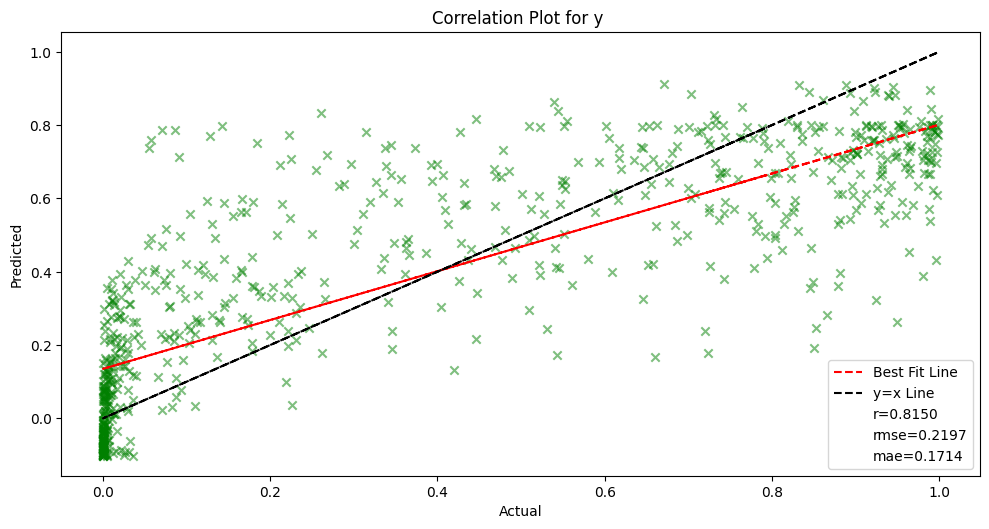

3.8535*Gauss(X1) + -6.3875*Gauss(X2) + 0.2970*Gauss(X3) + 2.9993*Gauss(X4) + 1.1574*Gauss(X5) + -0.0853*Gauss(X6) + -0.0853 = y'
['p<0.001', 'p<0.001', 'p>0.05', 'p>0.05', 'p>0.05']


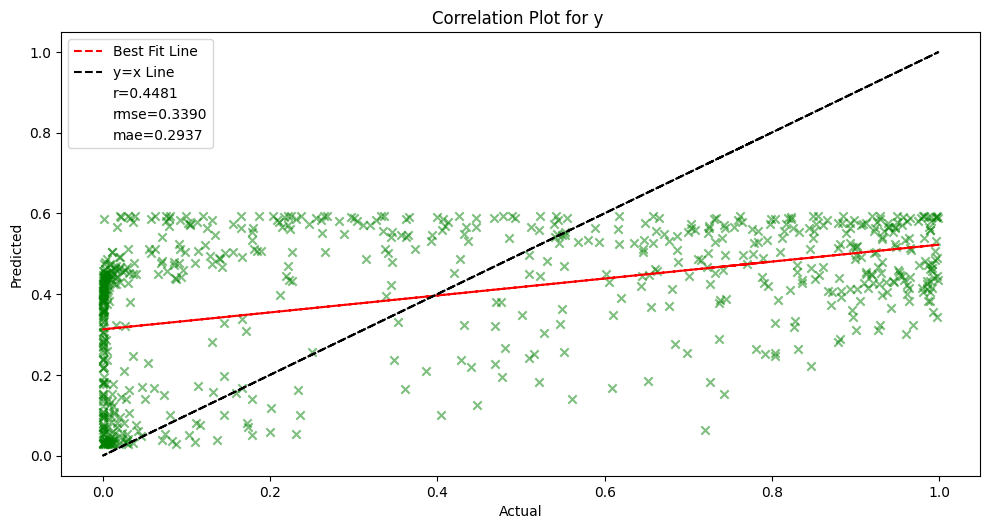

-41.9935*Lap(X1) + 41.0046*Lap(X2) + -0.1874*Lap(X3) + -10.3813*Lap(X4) + 0.4122*Lap(X5) + 2.4039*Lap(X6) + 2.4039 = y'
['p>0.05', 'p>0.05', 'p>0.05', 'p<0.05', 'p<0.001']


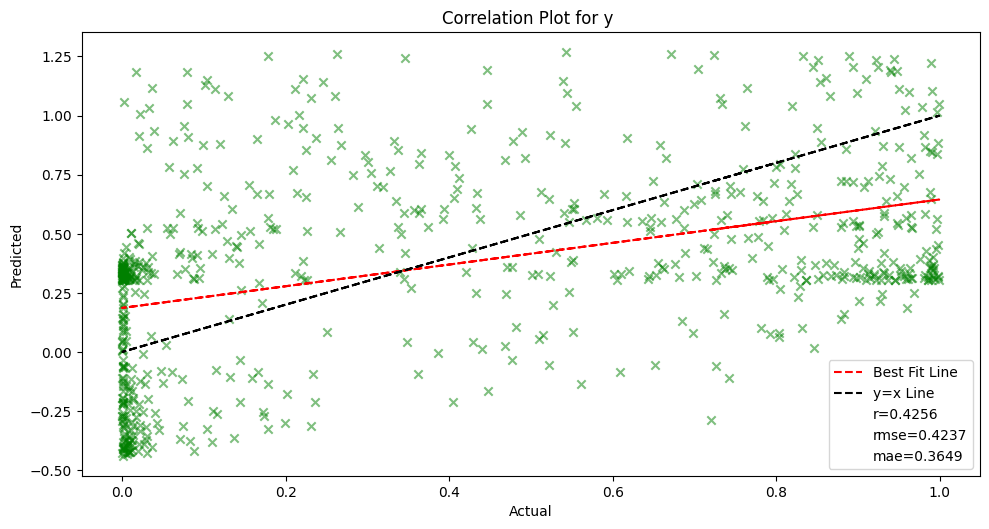

-13.1296*tanh(X1) + 15.1281*tanh(X2) + 0.0912*tanh(X3) + -0.7458*tanh(X4) + -0.4304*tanh(X5) + 0.0852*tanh(X6) + 0.0852 = y'
['p<0.001', 'p<0.001', 'p>0.05', 'p<0.001', 'p<0.001']


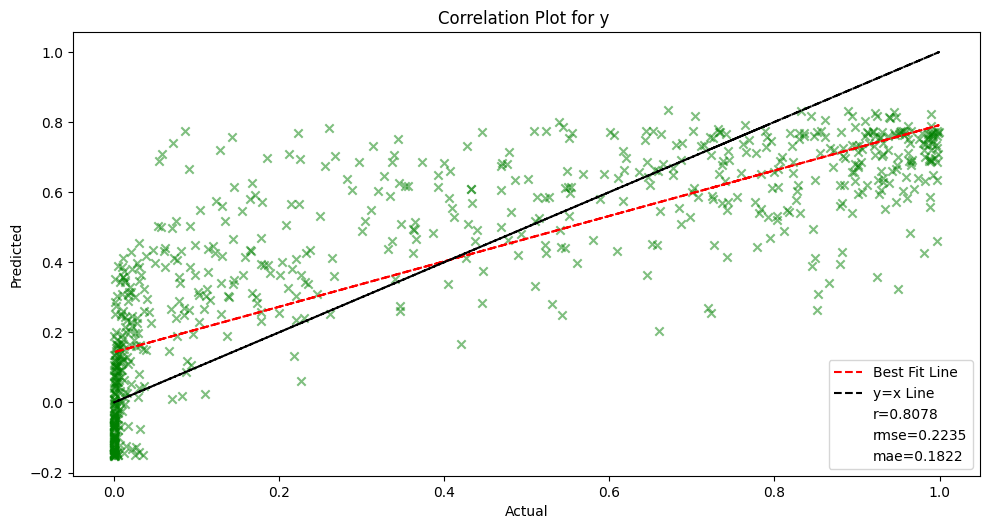

3.8535*Id(X1) + -6.3875*Id(X2) + 0.2970*Id(X3) + 2.9993*Id(X4) + 1.1574*Id(X5) + -0.0853*Id(X6) + -0.0853 = y'
['p<0.001', 'p<0.001', 'p<0.001', 'p<0.001', 'p<0.001']


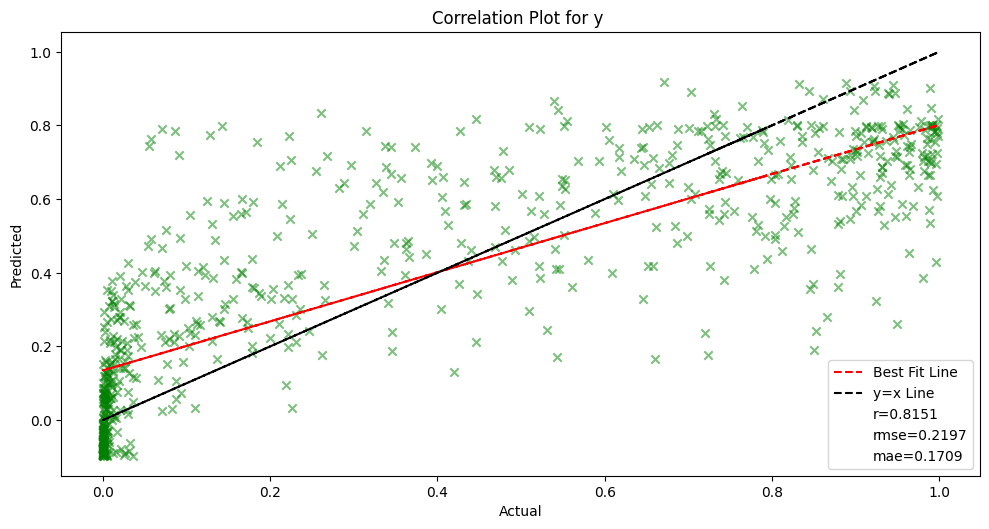

In [33]:
theta_sigmoid = get_theta(X, y, sigmoid)
print_poly(theta_sigmoid, "Sig")
plot_y(X_test, y_test, theta_sigmoid, sigmoid)

theta_gaussian = get_theta(X, y, gaussian)
print_poly(theta_gaussian, "Gauss")
plot_y(X_test, y_test, theta_gaussian, gaussian)

theta_laplacian = get_theta(X, y, laplacian)
print_poly(theta_laplacian, "Lap")
plot_y(X_test, y_test, theta_gaussian, laplacian)

theta_tanh_0_1 = get_theta(X, y, tanh_0_1)
print_poly(theta_tanh_0_1, "tanh")
plot_y(X_test, y_test, theta_tanh_0_1, tanh_0_1)

theta_identity = get_theta(X, y, identity)
print_poly(theta_gaussian, "Id")
plot_y(X_test, y_test, theta_identity, identity)



- ***OBSERVATIONS***
    - It is clear from pearson co-relation co-efficients that the *sigmoid* and *modified $tanh$*(i.e., $0.5*(1+tanh)$) performs better than their *gaussian* and *laplacian* counterparts.
    - p-values suggest $y$ does not vary with $X3$ as significantly as other features.

### Testing GD performance

Emprical Risk(Training) at epoch 1: 0.7880402739261217 | Emprical Risk(Validation) at epoch 1: 0.47380271837894417
Emprical Risk(Training) at epoch 51: 0.07735200636082451 | Emprical Risk(Validation) at epoch 51: 0.08219744908542966
Emprical Risk(Training) at epoch 62: 0.07452812923391416 |  Emprical Risk(Validation) at epoch 62: 0.07944141083118168


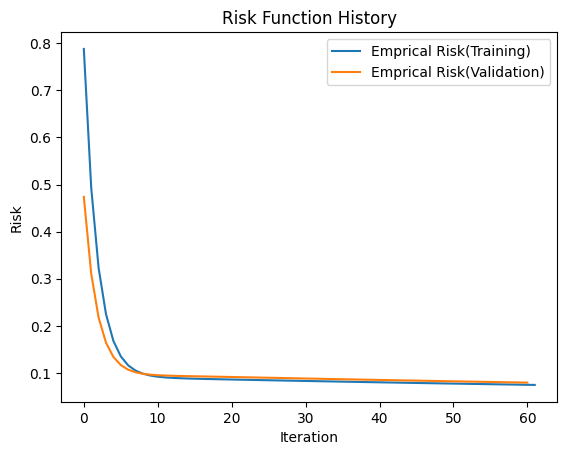

0.5444*Sig(X1) + -0.0482*Sig(X2) + 0.0829*Sig(X3) + 0.0415*Sig(X4) + 0.2278*Sig(X5) + -0.0354*Sig(X6) + -0.0354 = y'
['p>0.05', 'p>0.05', 'p>0.05', 'p>0.05', 'p<0.05']


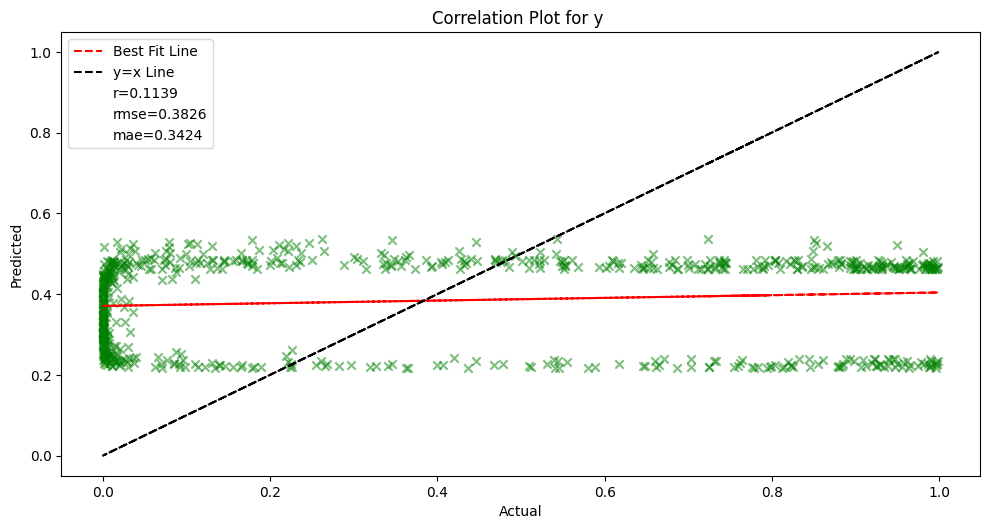

Emprical Risk(Training) at epoch 1: 0.6408679143260588 | Emprical Risk(Validation) at epoch 1: 0.47276767526726426
Emprical Risk(Training) at epoch 22: 0.0713204995140959 |  Emprical Risk(Validation) at epoch 22: 0.07411827868567508


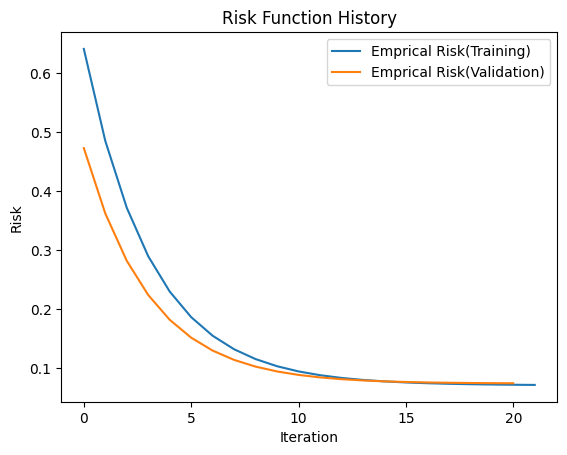

0.0528*G(X1) + 0.3207*G(X2) + 0.1282*G(X3) + 0.7332*G(X4) + 0.7050*G(X5) + -0.1888*G(X6) + -0.1888 = y'
['p>0.05', 'p>0.05', 'p>0.05', 'p>0.05', 'p>0.05']


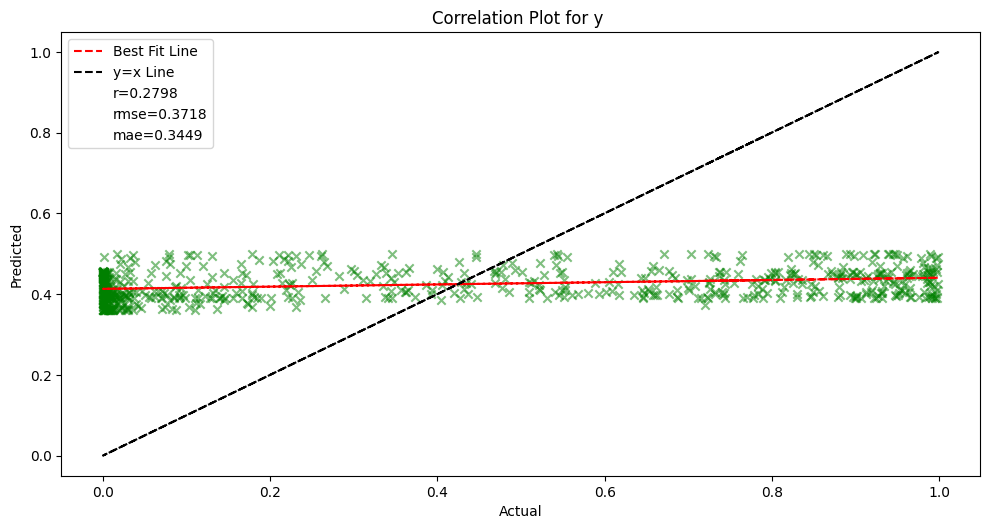

Emprical Risk(Training) at epoch 1: 0.6481901675411312 | Emprical Risk(Validation) at epoch 1: 0.4862135749845769
Emprical Risk(Training) at epoch 25: 0.079871108319863 |  Emprical Risk(Validation) at epoch 25: 0.08259363731657211


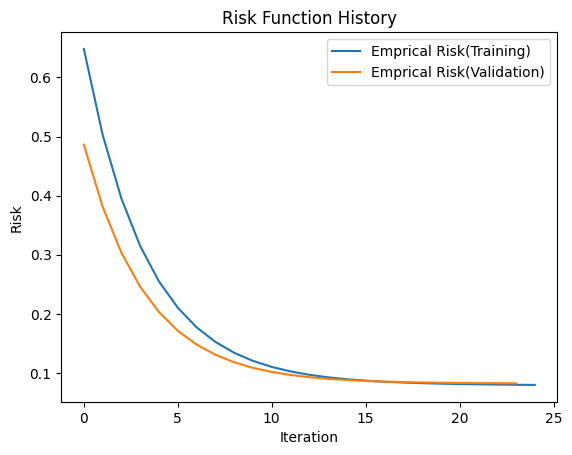

0.0815*L(X1) + 0.4822*L(X2) + -0.1733*L(X3) + 0.3073*L(X4) + 0.1336*L(X5) + 0.1828*L(X6) + 0.1828 = y'
['p>0.05', 'p>0.05', 'p>0.05', 'p>0.05', 'p>0.05']


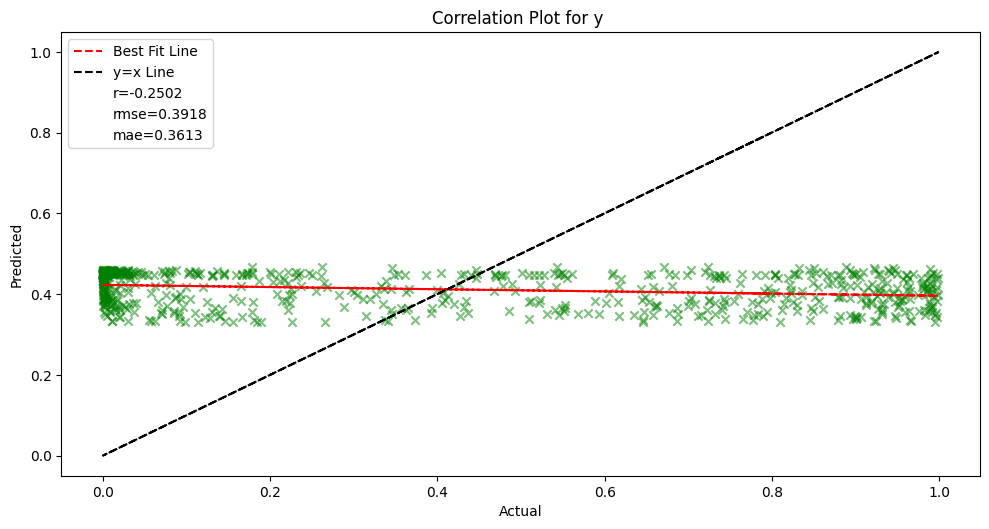

Emprical Risk(Training) at epoch 1: 1.4245360967328753 | Emprical Risk(Validation) at epoch 1: 0.7662447999371029
Emprical Risk(Training) at epoch 36: 0.04017369859488497 |  Emprical Risk(Validation) at epoch 36: 0.03955233892443365


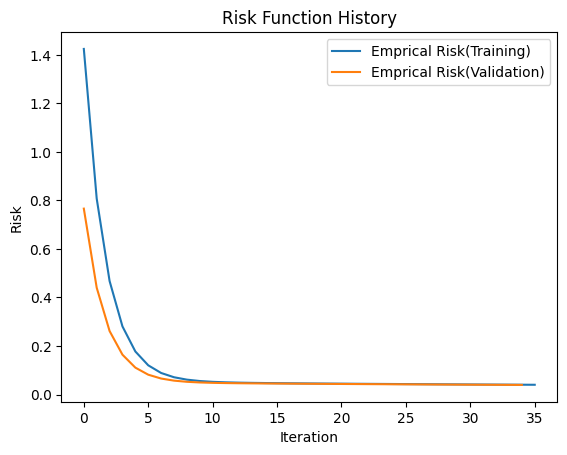

-0.2188*tanh(X1) + 0.3137*tanh(X2) + 0.4746*tanh(X3) + -0.0808*tanh(X4) + -0.2990*tanh(X5) + 0.2939*tanh(X6) + 0.2939 = y'
['p>0.05', 'p>0.05', 'p<0.001', 'p>0.05', 'p<0.001']


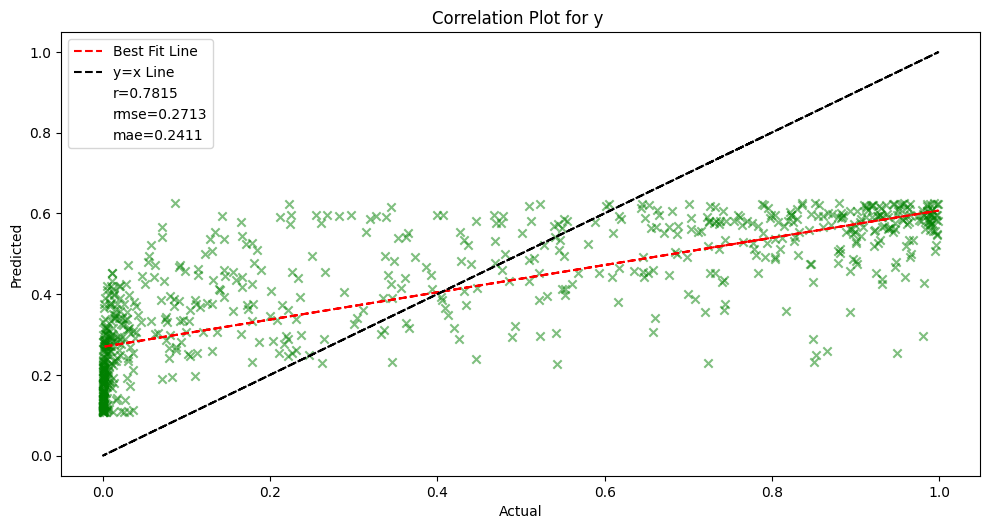

Emprical Risk(Training) at epoch 1: 0.524094799600433 | Emprical Risk(Validation) at epoch 1: 0.45220251847377513
Emprical Risk(Training) at epoch 44: 0.03670505942564563 |  Emprical Risk(Validation) at epoch 44: 0.03682226407096732


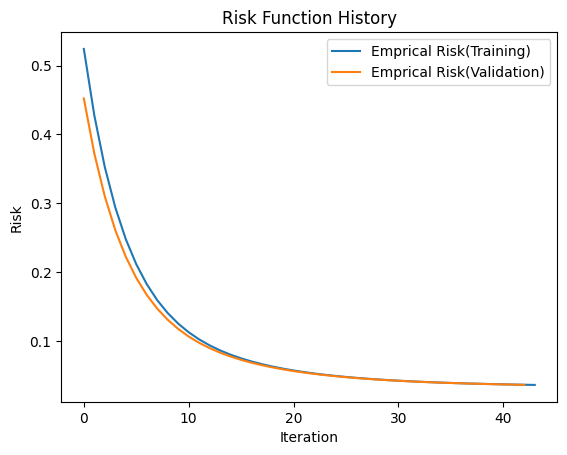

-0.0348*Id(X1) + 0.1976*Id(X2) + 0.3049*Id(X3) + 0.2092*Id(X4) + -0.2326*Id(X5) + 0.1868*Id(X6) + 0.1868 = y'
['p>0.05', 'p>0.05', 'p<0.001', 'p<0.001', 'p<0.001']


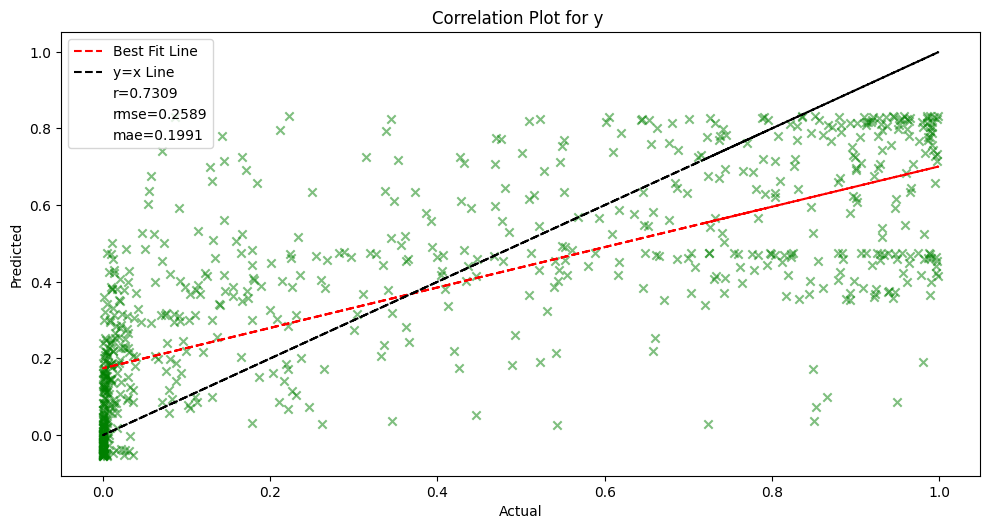

In [34]:
theta_gd_sig, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, sigmoid)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_sig, "Sig")
plot_y(X_test, y_test, theta_gd_sig, sigmoid)

theta_gd_gauss, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, gaussian)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_gauss, "G")
plot_y(X_test, y_test, theta_gd_gauss, gaussian)

theta_gd_lap, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, laplacian)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_lap, "L")
plot_y(X_test, y_test, theta_gd_lap, laplacian)

theta_gd_tanh, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, tanh_0_1)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_tanh, "tanh")
plot_y(X_test, y_test, theta_gd_tanh, tanh_0_1)

theta_gd_identity, train_losses, val_losses = grad_desc_sq_err(
    X_train, y_train, X_val, y_val, identity)
plot_train_loss(train_losses, val_losses)
print_poly(theta_gd_identity, "Id")
plot_y(X_test, y_test, theta_gd_identity, identity)

- ***OBSERVATIONS***
    - It is clear from pearson co-relation co-efficients that the *modified $tanh$*(i.e., $0.5*(1+tanh)$) performs better than its *sigmoid*, *gaussian* and *laplacian* counterparts.
    - p-values suggest $X3$ and $X5$ are significant in determining $y$.

## Q4 & Q5

Google Collab Notebook link (with **completed outputs** for Q4 and Q5) :- *https://colab.research.google.com/drive/1mOnPaE0Lly2Ww-ENDER30TNwb9fJaZFt?usp=sharing*
